In [200]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.stats import zscore
import warnings
warnings.filterwarnings('ignore')


#Part-1
from sklearn.impute import SimpleImputer
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from mpl_toolkits.mplot3d import Axes3D
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist  #Pairwise distribution between data points
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split


#Part2:
from sklearn.impute import KNNImputer
from imblearn.over_sampling import SMOTE


#Part-3:
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from scipy.stats import zscore
from sklearn.decomposition import PCA

#Part-4:
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

#Part-5:
from sklearn.decomposition import PCA, IncrementalPCA


# `Part-1`

### `1.1. Import and warehouse data:`

- Import all the given datasets and explore shape and size.
- Merge all datasets onto one and explore final shape and size.
- Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use.
- Import the data from above steps into python

In [3]:
#loading CSV file
Part1_csv = pd.read_csv("Part1 - Car name.csv")
#CSV file size, shape
Part1_csv.shape, Part1_csv.size

((398, 1), 398)

In [4]:
#CSV sample
Part1_csv.sample(5)

,car_name
351,ford escort 4w
144,toyota corona
241,datsun 810
310,toyota corolla tercel
292,chrysler lebaron town @ country (sw)


- One attribute holds just car names

In [5]:
#Loading JSON file
Part1_json = pd.read_json("Part1 - Car-Attributes.json")
#JSON file size, shape
Part1_json.shape, Part1_json.size

((398, 8), 3184)

In [6]:
#JSON sample
Part1_json.sample(5)

,mpg,cyl,disp,hp,wt,acc,yr,origin
258,20.6,6,231.0,105,3380,15.8,78,1
4,17.0,8,302.0,140,3449,10.5,70,1
37,18.0,6,232.0,100,3288,15.5,71,1
201,18.5,6,250.0,110,3645,16.2,76,1
284,20.6,6,225.0,110,3360,16.6,79,1


- All numerical attributes of Cars related

In [7]:
#Merging
Part1_df = pd.concat([Part1_csv,Part1_json], axis=1)
Part1_df.shape, Part1_df.size

((398, 9), 3582)

In [8]:
#Lets verify by reading the first row of each datasets
Part1_csv.head(1)

,car_name
0,chevrolet chevelle malibu


In [9]:
Part1_json.head(1)

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1


In [10]:
Part1_df.head(1)

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1


- Merging is done well. No issues.

In [11]:
# saving the dataframe to CSV, JSON, Excel files
Part1_df.to_csv('USL_Part1_df.csv')
Part1_df.to_excel('USL_Part1_df.xlsx')
Part1_df.to_json('USL_Part1_df.json')

Observations from the sizes wise after saving.

- JSON file is aroud 40KB, which doubles than other 2 formats but effective.
- CSV is very less in size

In [12]:
#Reading again from the saved files
Backup_csv = pd.read_csv("USL_Part1_df.csv")
Backup_xlsx = pd.read_excel("USL_Part1_df.xlsx")
Backup_json = pd.read_json("USL_Part1_df.json")
Backup_csv.shape,Backup_xlsx.shape,Backup_json.shape

((398, 10), (398, 10), (398, 9))

In [14]:
#Samples from those files to know why json alone have 9 attributes
Backup_json.head(1)

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1


In [17]:
print(Backup_csv.head(1))
print(Backup_xlsx.head(1))

   Unnamed: 0                   car_name   mpg  cyl   disp   hp    wt   acc  \
0           0  chevrolet chevelle malibu  18.0    8  307.0  130  3504  12.0   

   yr  origin  
0  70       1  
   Unnamed: 0                   car_name   mpg  cyl   disp   hp    wt   acc  \
0           0  chevrolet chevelle malibu  18.0    8  307.0  130  3504  12.0   

   yr  origin  
0  70       1  


- Part1_df is saved as it is in JSON format (9 columns) & effective
- But in Excel, CSV format,  Part1_df's index is also saved as one separate column & nosiy data

### `1.2. Data cleansing:`

- Missing/incorrect value treatment
- Drop attribute/s if required using relevant functional knowledge
- Perform another kind of corrections/treatment on the data.

In [18]:
#Car name is not necessary to predict mpg values, so lets drop it
Part1_df = Part1_df.drop('car_name', axis=1)

In [19]:
#Lets know more about the data
Part1_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    int64  
 2   disp    398 non-null    float64
 3   hp      398 non-null    object 
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
 6   yr      398 non-null    int64  
 7   origin  398 non-null    int64  
dtypes: float64(3), int64(4), object(1)
memory usage: 25.0+ KB


- Hp is object now. Lets convert it to numeric.
- If this is in numeric, all special characters present is also treated as NaN values

In [20]:
#Hp to Numeric
Part1_df['hp'] = pd.to_numeric(Part1_df['hp'],errors='coerce')
Part1_df['hp'].dtype

dtype('float64')

In [21]:
#Any null values
Part1_df.isnull().sum()

mpg       0
cyl       0
disp      0
hp        6
wt        0
acc       0
yr        0
origin    0
dtype: int64

- There are 6 missing values in hp
- Since the dataset size is less, lets replace it with median values

In [23]:
#Imputing null values with Medians
imputer = SimpleImputer(strategy='median')
imputer.fit(Part1_df)

SimpleImputer(strategy='median')

In [24]:
#Checking imputer caluclated medians values & compare with original dataset median values
imputer.statistics_

array([2.3000e+01, 4.0000e+00, 1.4850e+02, 9.3500e+01, 2.8035e+03,
       1.5500e+01, 7.6000e+01, 1.0000e+00])

In [25]:
Part1_df.median().values

array([2.3000e+01, 4.0000e+00, 1.4850e+02, 9.3500e+01, 2.8035e+03,
       1.5500e+01, 7.6000e+01, 1.0000e+00])

- Since Imputer median values, our df median values are same.
- Lets transform the Part1_df now

In [27]:
#Since Imputer returns ndarray type, so lets store it in temp first
temp = imputer.transform(Part1_df)

#Storing the transofrmed array into Dataframe
Part1_df = pd.DataFrame(temp,columns=Part1_df.columns, index=Part1_df.index)

In [29]:
#Rechecking null values
Part1_df.isnull().sum()

mpg       0
cyl       0
disp      0
hp        0
wt        0
acc       0
yr        0
origin    0
dtype: int64

- There are no null values now

##### Another corrections

In [30]:
#No duplicated rows
Part1_df.duplicated().sum()

0

In [50]:
#Verifying for any special characters present in the data
import string
alphabet = string.ascii_letters+string.digits
for i in Part1_df.columns:
    print(i),print(Part1_df[i].astype(str).str.strip(alphabet).any())


mpg
.
cyl
.
disp
.
hp
.
wt
.
acc
.
yr
.
origin
.


- Since we have Float numbers, so  '.' is excluded.
- We find no other improper values in the fields.
- Samthing can be done using isdigit() method as well as shown below.

In [53]:
#IsDigit method
for i in Part1_df.columns:
    temp = pd.DataFrame(Part1_df[i].astype(str).str.isdigit()) 
    temp[temp[i] == False]

- All good with data & good to go.

### `1.3. Data analysis & visualisation:`
- Perform detailed statistical analysis on the data.
- Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis.
- Hint: Use your best analytical approach. Even you can mix match columns to create new columns which can be used for better analysis. Create your own features if required. Be highly experimental and analytical here to find hidden patterns.

In [54]:
Part1_df.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
hp,398.0,104.304020,38.222625,46.0,76.000,93.5,125.000,230.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0
origin,398.0,1.572864,0.802055,1.0,1.000,1.0,2.000,3.0


- origin seems to be catogorical & ranges from 1 to 3. 
- yr seems to be Year (manfactured/released) and ranges from 70 to 82
- wt is having way higher numbers then other attributes
- wt mean 2970 & max is 5140. Looks like we have outliers here.
- Target variable mpg has mean 23.5, 50% 23. Seems to be normal distribution.
- cyl seems to be catogorical & ranges from 3 to 8

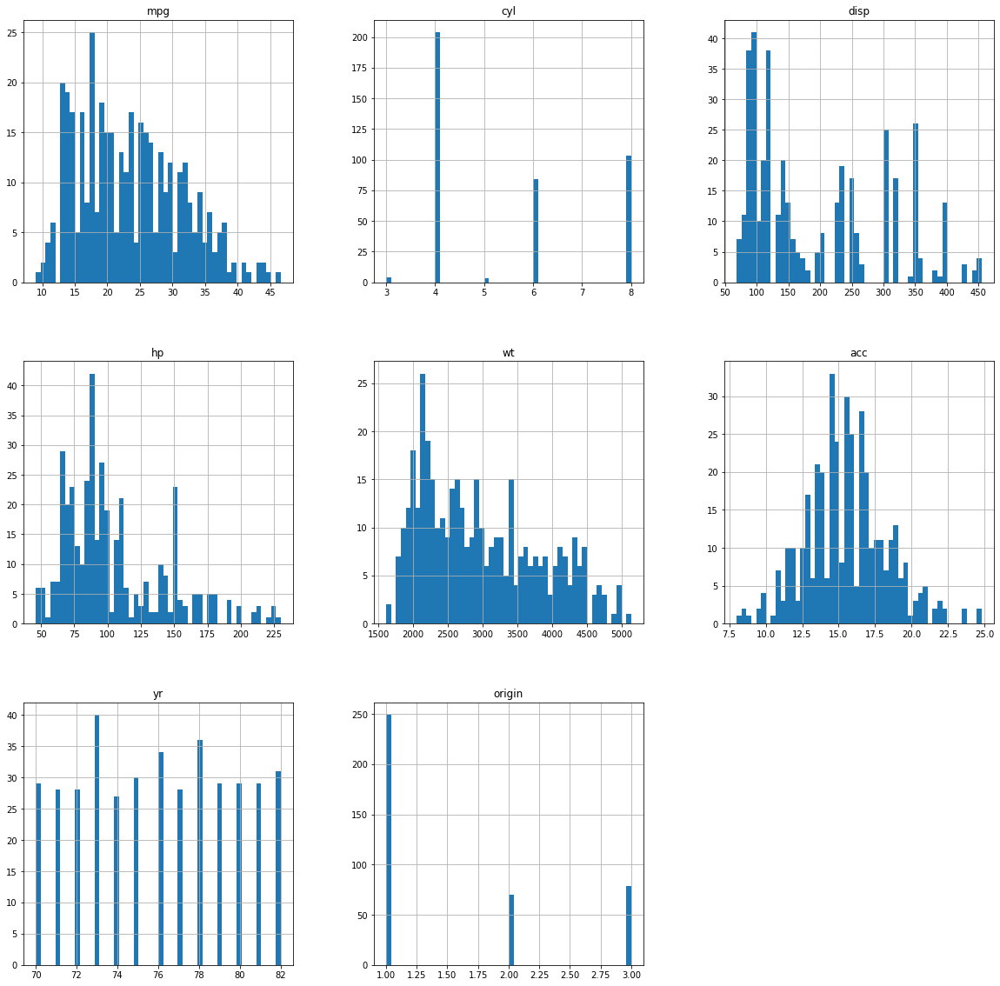

In [55]:
#Histograms
columns = list(Part1_df)
Part1_df[columns].hist(stacked=False, bins=50, figsize=(20,20)); 

- mpg is right skewed ; cars with lower mpg is high in numbers than with max mpg
- cars with cyl as 4 are high in numbers
- we can see aroud 3-4 clusters by looking at disp distribution
- hp, wt are also right skewed but we can see it has 2-3 culsters
- Cars with wt aroud 2000 are very high in numbers
- Acc is very much like normal distribution
- Cars with 73 yr are higher
- Cars with 1 origin is higher

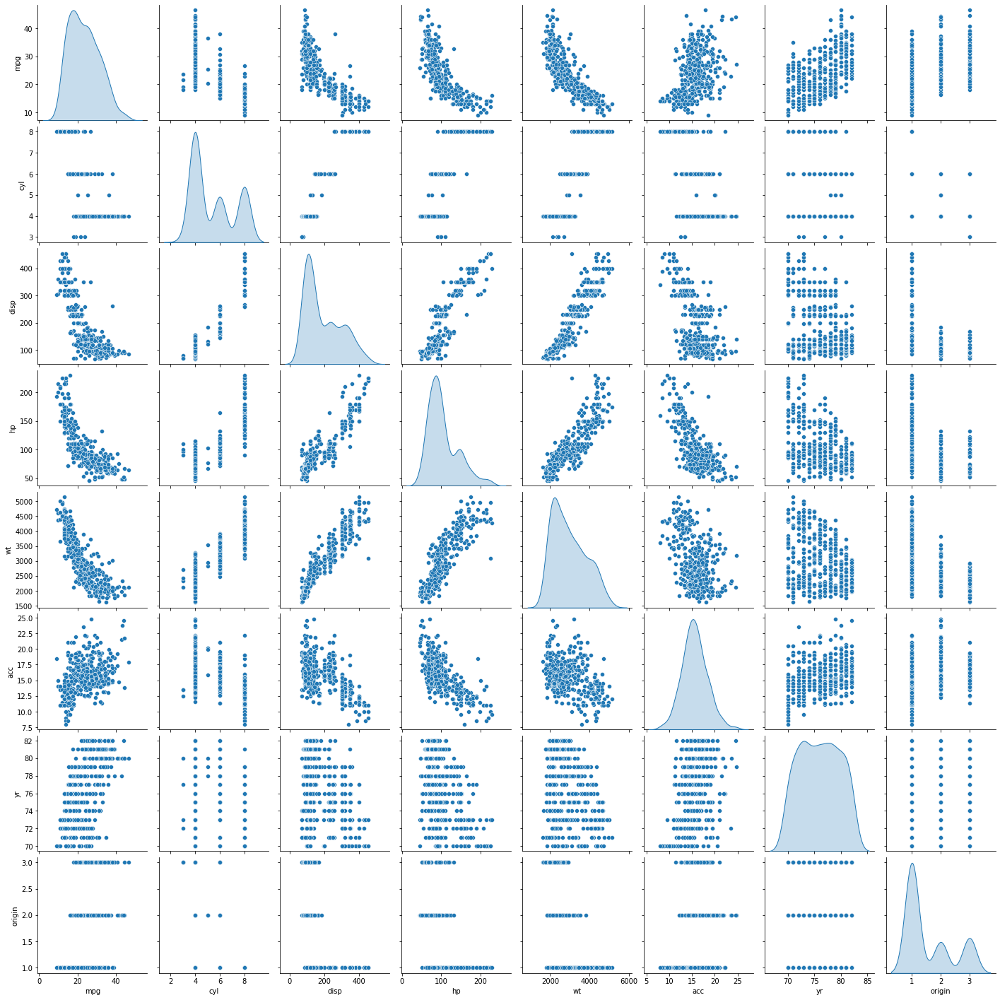

In [56]:
##Pairplot
sns.pairplot(Part1_df, diag_kind='kde') 

- mpg vs disp/hp/wt is almost linear & has good relationship with respect to others (except year/origin)
- from grpah, cyl & origin has 3 classes
- hp vs disp vs wt has almost linearly related with each other
- acc vs hp is also almost linear
- yr seems to have no proper pattern against any feature
- origin with 1 has many data points
- Origin & Yr can be combined

###### New attribute `dispercyl`

<AxesSubplot:xlabel='dispercyl', ylabel='Density'>

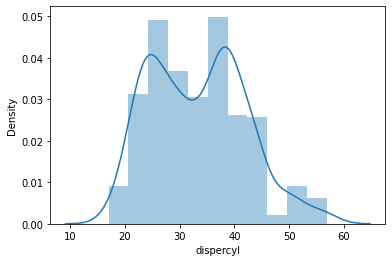

In [62]:
#Lets define new column 
Part1_df['dispercyl'] = Part1_df['disp'] / Part1_df['cyl']
sns.distplot(Part1_df['dispercyl'], kde=True)

##### ` Combining Origin & Yr `

- Replacing it with its relative frequency values

 Ex: Yr-76, origin - 2 then new var= no.of 762/total values

In [63]:
# Combining feature year and origin
Part1_df["Yr_Origin"] = Part1_df["yr"]*10 + Part1_df["origin"]

#frequency counts
key, val = np.unique(Part1_df["Yr_Origin"], return_counts=True)

key, val

(array([701., 702., 703., 711., 712., 713., 721., 722., 723., 731., 732.,
        733., 741., 742., 743., 751., 752., 753., 761., 762., 763., 771.,
        772., 773., 781., 782., 783., 791., 792., 793., 801., 802., 803.,
        811., 812., 813., 821., 822., 823.]),
 array([22,  5,  2, 20,  4,  4, 18,  5,  5, 29,  7,  4, 15,  6,  6, 20,  6,
         4, 22,  8,  4, 18,  4,  6, 22,  6,  8, 23,  4,  2,  7,  9, 13, 13,
         4, 12, 20,  2,  9], dtype=int64))

In [64]:
#Replace with the relative frequency
Part1_df["Yr_Origin"].replace(dict(zip(key, val/Part1_df.shape[0])), inplace=True)

#Dropping features yr and origin
Part1_df.drop(["yr", "origin"], axis=1, inplace=True)

#New sample
Part1_df.sample(3)

,mpg,cyl,disp,hp,wt,acc,dispercyl,Yr_Origin
145,32.0,4.0,83.0,61.0,2003.0,19.0,20.75,0.015075
204,32.0,4.0,85.0,70.0,1990.0,17.0,21.25,0.010050
121,15.0,8.0,318.0,150.0,3399.0,11.0,39.75,0.072864


### `Scaling`

As we know distance is very sensitive to its units. So we have to scale them

In [65]:
##Scale the data
Part1_df_Z = Part1_df.apply(zscore)

Part1_df_Z.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,7.141133e-17,1.001259,-1.859374,-0.770491,-0.065919,0.702705,2.957335
cyl,398.0,-3.570567e-17,1.001259,-1.444949,-0.856321,-0.856321,1.498191,1.498191
disp,398.0,-1.785283e-17,1.001259,-1.204411,-0.856318,-0.431404,0.658488,2.511784
hp,398.0,-7.141133e-17,1.001259,-1.527300,-0.741436,-0.283016,0.542140,3.292662
wt,398.0,-1.606755e-16,1.001259,-1.604943,-0.882827,-0.197362,0.753834,2.565185
acc,398.0,-2.677925e-16,1.001259,-2.747814,-0.632879,-0.024722,0.583435,3.351912
dispercyl,398.0,-1.606755e-16,1.001259,-1.886169,-1.007343,-0.003656,0.639856,2.709659
Yr_Origin,398.0,1.338962e-16,1.001259,-1.754707,-0.973529,0.328435,0.849221,1.760596


- Z score gives equal std deviation acorss all features

<AxesSubplot:>

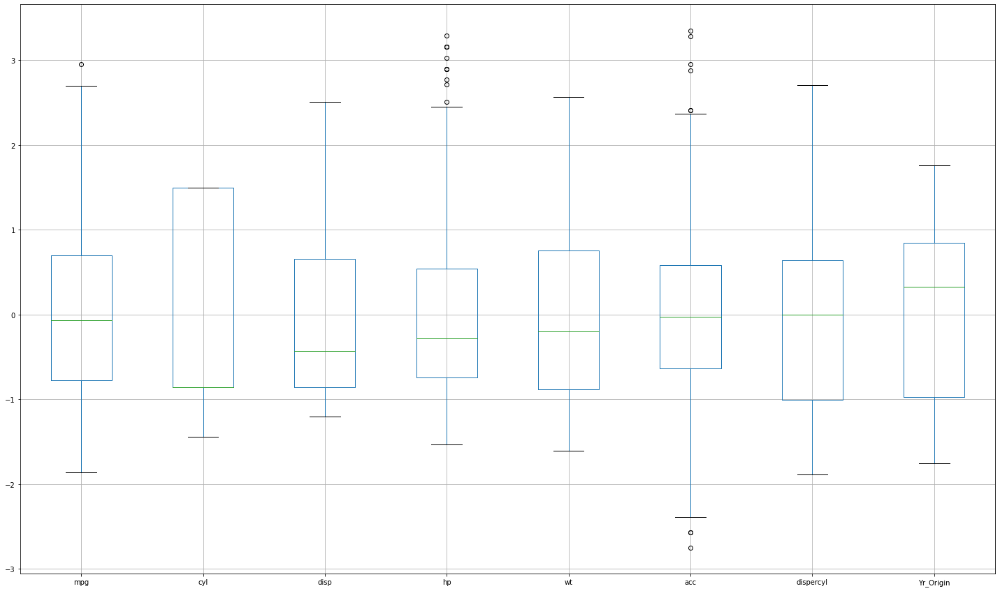

In [66]:
#boxplot to check for outliers
plt.figure(figsize=(25,15))
Part1_df_Z.boxplot()

- hp, acc, mpg have outliers
- acc has outliers at both ends
- mpg, acc, hp median is closer to the center of the box

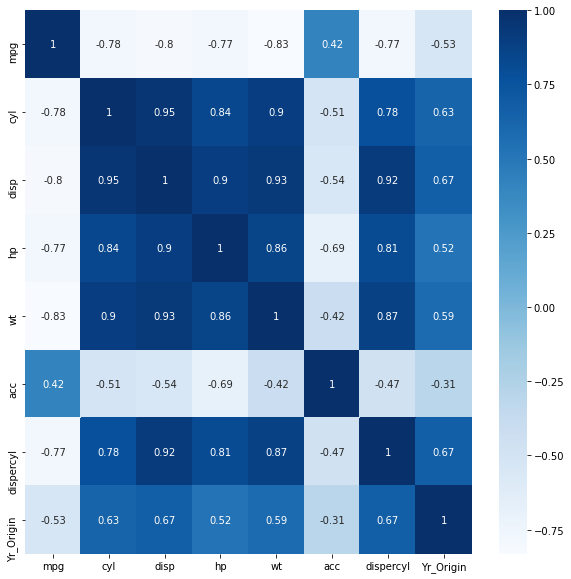

In [67]:
#plotting the correlation 
fig,ax=plt.subplots(figsize=(10,10))
sns.heatmap(Part1_df_Z.corr(),ax=ax,annot=True,cmap='Blues')
plt.show()

- cyl, disp, hp, wt, dispercyl have high positive correlation with each other
- mpg has high negative correlation with cyl,disp,hp,wt
- acc is only one has positive correlation with mpg
- cyl vs disp is very high +ve correlation
- acc has negative correlation with cyl, disp, hp, wt

### `1.4. Machine learning:`

- Use K Means and Hierarchical clustering to find out the optimal number of clusters in the data.
- Share your insights about the difference in using these two methods.

### `K-Means `

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

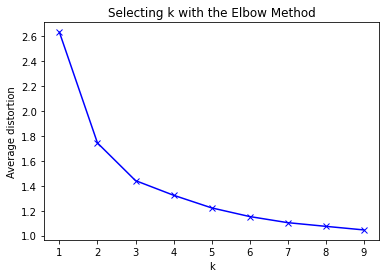

In [71]:
#Finding optimal no. of clusters
clusters = range(1,10)
meanDistortions = []

for k in clusters:
    model = KMeans(n_clusters=k)
    model.fit(Part1_df_Z)
    prediction = model.predict(Part1_df_Z)
    meanDistortions.append(sum(np.min(cdist(Part1_df_Z, model.cluster_centers_, 'euclidean'), axis=1)) / Part1_df_Z.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

 - curve is bent at **3, 5**. Lets try both values & compare the results

#### K = 5

In [79]:
k_means = KMeans(n_clusters = 5)
k_means.fit(Part1_df_Z)
labels = k_means.labels_

In [80]:
# Calculating silhouette_score
silhouette_score(Part1_df_Z,labels)

0.32660208874620233

#### K = 3

In [81]:
k_means = KMeans(n_clusters = 3)
k_means.fit(Part1_df_Z)
labels = k_means.labels_

In [82]:
# Calculating silhouette_score
silhouette_score(Part1_df_Z,labels)

0.3859745124278654

- silhouette score is better for 3 clusters than for 5 clusters. So, final clusters will be 3

In [83]:
Part1_df["Clus_kmeans3"] = labels
Part1_df.sample(5)

,mpg,cyl,disp,hp,wt,acc,dispercyl,Yr_Origin,Clus_kmeans3
38,14.0,8.0,350.0,165.0,4209.0,12.0,43.750000,0.050251,2
186,27.0,4.0,101.0,83.0,2202.0,15.3,25.250000,0.020101,1
357,32.9,4.0,119.0,100.0,2615.0,14.8,29.750000,0.030151,1
369,34.0,4.0,112.0,88.0,2395.0,18.0,28.000000,0.050251,1
161,16.0,6.0,250.0,105.0,3897.0,18.5,41.666667,0.050251,0


In [84]:
Part1_df.Clus_kmeans3.value_counts().sort_index()

0    105
1    195
2     98
Name: Clus_kmeans3, dtype: int64

In [85]:
clust_profile = Part1_df
clust_profile = clust_profile.groupby('Clus_kmeans3').mean()
clust_profile['freq'] = Part1_df.Clus_kmeans3.value_counts().sort_index()

clust_profile

,mpg,cyl,disp,hp,wt,acc,dispercyl,Yr_Origin,freq
Clus_kmeans3,,,,,,,,,
0,20.751429,5.695238,209.580952,97.704762,3122.247619,16.565714,36.788492,0.050754,105
1,29.474872,4.056410,107.023077,79.148718,2300.143590,16.477436,26.376282,0.024146,195
2,14.615306,7.979592,348.040816,161.428571,4141.479592,12.689796,43.603316,0.055507,98


We have 2 kinds of values that influence mpg patterns(types of cars) here. 

1. acc (+ve correlation with mpg)
2. cyl,disp,hp,wt,Yr_Origin (-ve correlation with mg)

**Clusters**

- Cluster 2: Higher cyl,disp,hp,wt, Yr_Origin cars & with lower mpg, acc values
- Cluster 1: Lower cyl,disp,hp,wt,Yr_Origin cars & with higher mpg, acc values
- Cluster 0: Medium cyl,disp,hp,wt,Yr_Origin cars & with medium mpg, acc values

In [86]:
#Centroids
centroids = k_means.cluster_centers_
#Clculate the centroids for the columns
centroid_df = pd.DataFrame(centroids, columns = list(Part1_df_Z) )
centroid_df

,mpg,cyl,disp,hp,wt,acc,dispercyl,Yr_Origin
0,-0.353970,0.141544,0.155130,-0.172871,0.179507,0.362216,0.394571,0.614867
1,0.763538,-0.823116,-0.829689,-0.658954,-0.792503,0.330164,-0.805497,-0.763879
2,-1.140031,1.486178,1.484701,1.496403,1.384590,-1.045048,1.180020,0.861178


- Cluster 2 has lowest mpg,acc centroid values
- Clutser 1 has highest mpg,acc centroid values


- Cluster 2 has higher cyl,disp,hp,wt centroid values
- Cluster 1 has lower cyl,disp,hp,wt centroid values


- Cluster 2 has higher Yr_Origin centroid values; Latest year in dataset has lowest mpg cars
- Cluster 1 has lower Yr_Origin centroid values; Oldest year in dataset has higher mpg cars


- **Cluster 0** has all medium values which falls between higest & lowest mpg cars (Cluster 1 & 2)

##### Lets visualize mpg vs with one postive correlation attribute & one with negative correlation attribute

Text(0.5, 0.92, 'Mpg vs cyl vs acc')

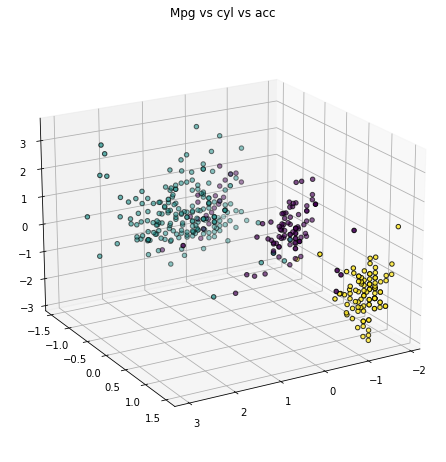

In [88]:
#Visualize 3D plots of clusters
fig = plt.figure(figsize=(8, 6))
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=20, azim=60)
k_means.fit(Part1_df_Z)
labels = k_means.labels_
ax.scatter(Part1_df_Z.iloc[:, 0], Part1_df_Z.iloc[:, 1], Part1_df_Z.iloc[:, 5],c=labels.astype(np.float), edgecolor='k')

ax.set_title('Mpg vs cyl vs acc')

Text(0.5, 0.92, 'Mpg vs hp vs wt')

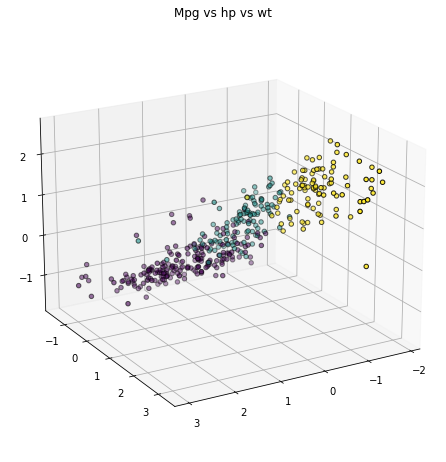

In [89]:
fig = plt.figure(figsize=(8, 6))
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=20, azim=60)
k_means.fit(Part1_df_Z)
labels = k_means.labels_
ax.scatter(Part1_df_Z.iloc[:, 0], Part1_df_Z.iloc[:, 3], Part1_df_Z.iloc[:, 4],c=labels.astype(np.float), edgecolor='k')
ax.set_title('Mpg vs hp vs wt')

- Other then cyl, if we plot any other attributes, we don't see a clear boundaries between the clusters
- Cyl is key attribute in determining the no.of clusters

### `Hierarchical clustering`

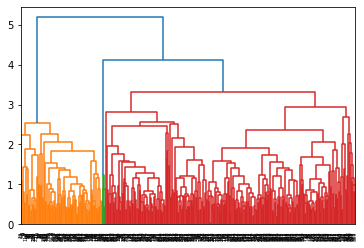

In [90]:
link_method = linkage(Part1_df_Z, method = 'average')

#Lets plot without labels as we can't display all car names here properly
dend = dendrogram(link_method)

- Very complex as the data is bigger

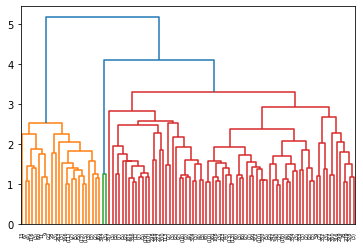

In [91]:
#Truncating to p=100
dend = dendrogram(link_method, truncate_mode='lastp',p=100)

- Truncating the original data clusters to 100 (club the nearest) & deploy on that.
- As we see there 3 optimal clusters orange, green, red ones
- Green seems to very far away from other clusters & has few data points

In [92]:
# Agglomerative Clustering to n=3 clusters
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean',  linkage='average')
model.fit(Part1_df_Z)

AgglomerativeClustering(linkage='average', n_clusters=3)

In [93]:
Part1_df['Agglo_n3'] = model.labels_
Part1_df.Agglo_n3.value_counts().sort_index()

0    297
1     97
2      4
Name: Agglo_n3, dtype: int64

From the above dendrogram picture.

**0 - Red cluster**

**1 - Orange cluster**

**2 - Green cluster**


In [94]:
#Cluster Profiles
clust_profile = Part1_df
clust_profile = clust_profile.groupby('Agglo_n3').mean()
clust_profile['freq'] = Part1_df.Agglo_n3.value_counts().sort_index()

clust_profile

,mpg,cyl,disp,hp,wt,acc,dispercyl,Yr_Origin,Clus_kmeans3,freq
Agglo_n3,,,,,,,,,,
0,26.177441,4.649832,144.304714,86.269360,2598.414141,16.425589,30.162177,0.033772,0.649832,297
1,14.528866,7.979381,348.020619,161.804124,4143.969072,12.641237,43.601804,0.055484,2.000000,97
2,43.700000,4.000000,91.750000,49.000000,2133.750000,22.875000,22.937500,0.016332,1.000000,4


- Cluster 2 is  high mpg cars
- Cluster 1 is low mpg cars
- Cluster 0 is medium level mpg cars


Cluster 2 has just 4 datapoints.

- As we know there's no clear boundary between medium & high mpg cars as seen in KMeans clustering plots.
- The min values of each attribute in cluster 0 & 1 are very similar. Very thin line.

Hierarchial clustering has clusbbed most of high level mpg cars into cluster 0 (medium)

#### Link methods

In [95]:
# cophenet index is a measure of the correlation between the distance of points in feature space and distance on dendrogram
# closer it is to 1, the better is the clustering

Z = linkage(Part1_df_Z, metric='euclidean', method='average')
c, coph_dists = cophenet(Z , pdist(Part1_df_Z))

c

0.7721235745420969

In [96]:
Z = linkage(Part1_df_Z, metric='euclidean', method='complete')
c, coph_dists = cophenet(Z , pdist(Part1_df_Z))

c

0.7535205755329731

In [97]:
Z = linkage(Part1_df_Z, metric='euclidean', method='ward')
c, coph_dists = cophenet(Z , pdist(Part1_df_Z))

c

0.7073023538774608

- Link method as **Average** is better than the rest of them

### `1.5. Answer below questions based on outcomes of using ML based methods.`

- Mention how many optimal clusters are present in the data and what could be the possible reason behind it.

- Use linear regression model on different clusters separately and print the coefficients of the models individually

- How using different models for different clusters will be helpful in this case and how it will be different than using one single model without clustering? Mention how it impacts performance and prediction.

###### 5.1 Optimal clusters

As we have seen in both KMeans & Hierarchical clustering techniques, 3 seems to be optimal value for clusters.

This is regression problem & we have 'mpg' as target attribute & others (cyl,disp,hp,wt,acc) as predictors.

In general, we have classify the cars as follows.

**1. Lower mpg cars**

**2. Medium mpg cars**

**3. High mpg cars**


And we have acc in postive correlation with mpg & others have negative correlation with mpg.

So all the datapoints can be classified as 3 typical Clusters as classified above.

We can further divide the medium datapoints into (lower medium/medium/higher medium), but as we have seen above steps, coefficient measures indicate that our model is good with 3 clusters. 

##### 5.2 Use linear regression model on different clusters separately and print the coefficients of the models individually

- Linear Regression on created clusters

#####  Linear Regression on whole data set `**without clustering**`

In [99]:
X = Part1_df.drop(['mpg','Clus_kmeans3','Agglo_n3'], axis=1)
# the dependent variable
y = Part1_df[['mpg']]

#XScaled = X.apply(zscore)
# Split X and y into training and test set in 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)
LR = LinearRegression()
LR.fit(X_train, y_train)
print('Train Score:',LR.score(X_train, y_train))
print('Test Score:',LR.score(X_test, y_test))

for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, LR.coef_[0][idx]))

intercept = LR.intercept_[0]
print("The intercept for our model is {}".format(intercept))

Train Score: 0.7211568259901788
Test Score: 0.7688500196717772
The coefficient for cyl is -5.206772112252505
The coefficient for disp is 0.1313709650439162
The coefficient for hp is -0.08236136479840814
The coefficient for wt is -0.002728978750449945
The coefficient for acc is -0.17148095563249993
The coefficient for dispercyl is -0.8911369172917524
The coefficient for Yr_Origin is 25.429298249282166
The intercept for our model is 74.53804739458495


- The model is under-fitting
- Please note we have created two new attribute by combining origin & Year & one is to dispercyl (disp, cyl)

##### Linear Regression on `**each cluster without scaling**`

In [101]:
coef_df = pd.DataFrame()
intercepts = []
clusters = []
for i in range(3):
    Cluster = Part1_df[Part1_df['Clus_kmeans3'] == i]
    # independant variables
    X = Cluster.drop(['mpg','Clus_kmeans3','Agglo_n3','Yr_Origin'], axis=1)
    # the dependent variable
    y = Cluster[['mpg']]
    if i == 0:
        coef_df = pd.DataFrame(columns=X.columns)
    # Split X and y into training and test set in 70:30 ratio
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)
    LR = LinearRegression()
    LR.fit(X_train, y_train)
    print('Score for Cluster:',i,'is',LR.score(X_train, y_train))
    temp = pd.DataFrame(LR.coef_, columns=X.columns)
    coef_df = pd.concat([coef_df, temp])
    intercepts.append(LR.intercept_)
    clusters.append(i)

coef_df['Intercept'] = intercepts
coef_df['Clusters'] = clusters

Score for Cluster: 0 is 0.4105230539633925
Score for Cluster: 1 is 0.48051591171214525
Score for Cluster: 2 is 0.42697531919992904


- Linear Regression on whole dataset without clustering is more effective & score is around 85%




- In Cluster, all points are all very near to each other within specific radius. So the correlation/covariance among those points may not follow particualr direction
- So the Linear Regression method wouldn't predict well in such cases

In [102]:
print(coef_df.to_string(index=False))

      cyl      disp        hp        wt       acc  dispercyl             Intercept  Clusters
19.949531 -0.587772 -0.059911 -0.002586 -0.284691   3.504088   [-80.3868113670807]         0
50.704414 -1.939197 -0.211157 -0.004455 -0.189313   7.806062 [-144.62407400991486]         1
-0.057854 -0.026606 -0.043320 -0.002079 -0.137341   0.275096  [29.753097145637597]         2


- Cyl clearly the most important feature in classifying the clusters in the data
- More cyl the lower mpg the car has. & vice-versa.
- More the intercept is the lower mpg value would be.

##### Linear Regression `**on each cluster with scaling**`

In [103]:
coef_df = pd.DataFrame()
intercepts = []
clusters = []
for i in range(3):
    Cluster = Part1_df[Part1_df['Clus_kmeans3'] == i]
    # independant variables
    X = Cluster.drop(['mpg','Clus_kmeans3','Agglo_n3','Yr_Origin'], axis=1)
    # the dependent variable
    y = Cluster[['mpg']]
    if i == 0:
        coef_df = pd.DataFrame(columns=X.columns)
    XScaled = X.apply(zscore)
    # Split X and y into training and test set in 70:30 ratio
    X_train, X_test, y_train, y_test = train_test_split(XScaled, y, test_size=0.30, random_state=1)
    LR = LinearRegression()
    LR.fit(X_train, y_train)
    print('Score for Cluster:',i,'is',LR.score(X_train, y_train))
    temp = pd.DataFrame(LR.coef_, columns=X.columns)
    coef_df = pd.concat([coef_df, temp])
    intercepts.append(LR.intercept_)
    clusters.append(i)

coef_df['Intercept'] = intercepts
coef_df['Clusters'] = clusters

Score for Cluster: 0 is 0.4105230539633933
Score for Cluster: 1 is 0.4805159117121459
Score for Cluster: 2 is 0.34465913267584436


- Not much use even after scaling too.
- Linear Regression seems to be not a best for clusters

In [104]:
print(coef_df.to_string(index=False))

          cyl          disp        hp        wt       acc     dispercyl            Intercept  Clusters
 1.968632e+01 -2.574538e+01 -0.735412 -1.011832 -0.566797  1.476114e+01 [20.312615379039574]         0
 2.001330e+01 -4.126159e+01 -3.393695 -1.611998 -0.468970  3.590643e+01 [29.330821798785326]         1
-1.213210e+14  7.093057e+14 -1.210938 -0.937500 -0.265625 -6.874785e+14 [14.664246323529412]         2


- In scaled dataset, we have disp,hp,wt are very key factors to decide the mpg clusters
- Cyl plays a key role too in predicting mpg
- More the intercept is the lower mpg value would be.

######  How using different models for different clusters will be helpful in this case and how it will be different than using one single model without clustering? Mention how it impacts performance and prediction.


- As we have seen before, using single model the score is around 85% & but within clusters can't exceed 50%.
- Without clusters, datapoints follow a better linear relationship as seen in sns plots. So the score is better on whole dataset.



- Clusters data points are very near to each other
- No clear covariance/correlation direction among them
- Linear Model wouldn't be best here
- SVM, DT might be better than LR model
- Depends on the cluster points from visualization graphs, we can select model or use trail & error method.


- Cluster clubs the nearest points & ignores the points(far away) which have linear relationships. So this impacts performance of our model.

### `1.6. Improvisation:` 

- Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the company to perform a better data analysis in future.

###### Conclusions:
- Classifying the original dataset into optimal clusters & then using regression techniques for predicting the numerical outpur isn't that effective here
- Regression model on whole dataset without clustering is yeilded better results
- We have 2 catogorical values origin & Year. Clubbing both into one attribute is also not much effective. Because Year may be catogorical & surely has an effect on automobiles industry in real world.
- KMeans is better clustering method than Agglomaretive for this dataset
- Cyl played a key role both in determining mpg values & choosing optimal no.of clusters present in the dataset
- Attributes on original dataset has better correlation values among them compared to in individual clusters.

###### Improvements:

- **Quality:** Good, we have just 6 null values present in whole dataset

- **Quantity:** Not good enough to build any ML model. We have just 398 rows. In real world, we have few Automobile companies producing few models per year, so we can't expect lakhs of rows in dataset. But we could've captured the mpg details of each model acorss different parts of the world, that way we could have got more data to build better model.

- **Variety:** Balanced. We have all key factors like hp,disp,cyl,wt,acc which determines the mpg values.

- **Velocity:** The data genaration is very time consuming & isn't easy process. This takes much effort to regenarate the data of all models of different years across the companies.Data iscoming from various sources of different companies.

- **Veracity:** Same model might give different results across different parts of the world. Mpg depends on the quality of oil, quality of roads, slope of road as well. So we can't fully trust the values in our dataset as in real world & Data isn't coming from single source too.

# `PART-2`

### `2.1. Design a synthetic data generation model::`

which can impute values [Attribute: Quality] wherever empty the company has missed recording the data.

In [105]:
#Given Dataset
Part2_Given = pd.read_excel("Part2 - Company.xlsx")
Part2_Given.head(5)

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A


- Quality seems to have null values

In [106]:
Part2_Given.shape, Part2_Given.size

((61, 5), 305)

In [107]:
#Copying the original dataset before we start making any changes
Part2_df = Part2_Given.copy()
Part2_df.shape, Part2_df.size

((61, 5), 305)

In [108]:
Part2_df['Quality'].value_counts()

Quality A    26
Quality B    17
Name: Quality, dtype: int64

In [109]:
#Null values
Part2_df.isnull().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

- Quality has 10 null values
- We will impute those null values
- then create a synthetic model to balance the Quality

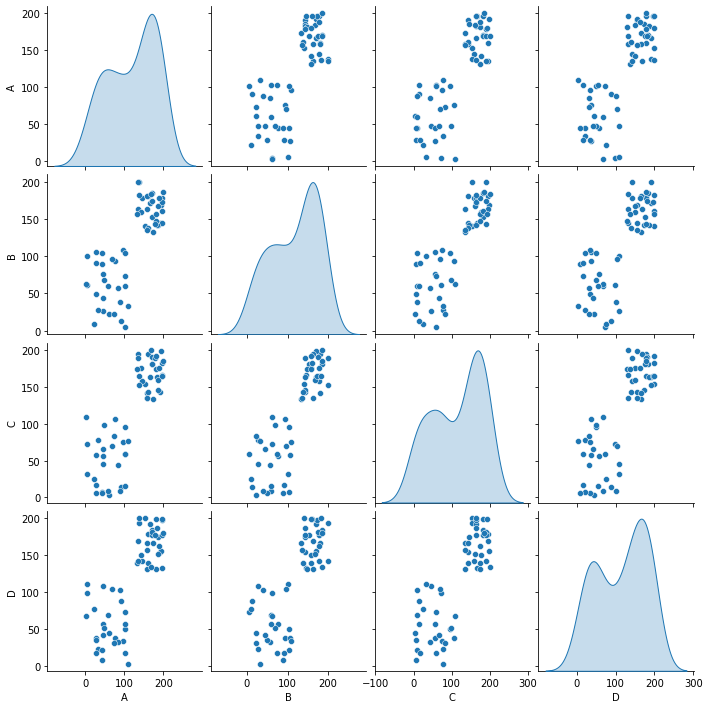

In [110]:
#Pair plot
sns.pairplot(Part2_df, diag_kind='kde') 

- 2 clusters preset with clear boundaries

In [114]:
cols = {"Quality":     {"Quality A": 1, "Quality B": 2 }}
Part2_df = Part2_df.replace(cols)
Part2_df.head()

,A,B,C,D,Quality
0,47,27,45,108,1.0
1,174,133,134,166,2.0
2,159,163,135,131,NaN
3,61,23,3,44,1.0
4,59,60,9,68,1.0


In [ ]:
### Using KNN imputer to impute NaN values in dataset

In [115]:
#Finds nearest 5 neighbours & then replace the NaN values
knn = KNNImputer(n_neighbors=5)
temp = knn.fit_transform(Part2_df)
Part2_df = pd.DataFrame(temp, columns=Part2_df.columns)

In [116]:
Part2_df['Quality'].value_counts()

2.0    33
1.0    28
Name: Quality, dtype: int64

         

##### Quality A (1)   Before  26          After  28
##### Quality B (2)   Before  17          After 33

<AxesSubplot:xlabel='Quality', ylabel='Density'>

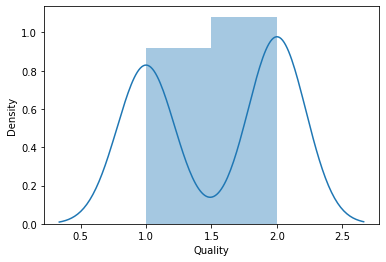

In [117]:
#Dist plot
sns.distplot(Part2_df['Quality'],kde=True)

##### Generating Syenthetic Data model using `**SMOTE**`

In [119]:
X = Part2_df.drop('Quality',axis=1)
y = Part2_df['Quality']

print("Before upsampling")
print(y.value_counts())

sm = SMOTE(random_state = 2)
Xs,Ys = sm.fit_resample(X,y)
print("After upsampling using Synthetic Data genaration:")
print(Ys.value_counts())

Before upsampling
2.0    33
1.0    28
Name: Quality, dtype: int64
After upsampling using Synthetic Data genaration:
2.0    33
1.0    33
Name: Quality, dtype: int64


In [122]:
#Syenthetic Dataset
Syn_df = pd.concat([Xs, Ys], axis=1, join='inner')
Syn_df = Syn_df.astype('int64')
Syn_df.tail(10)

,A,B,C,D,Quality
56,200,186,185,179,2
57,137,182,165,199,2
58,88,39,9,102,1
59,180,157,192,198,2
60,157,135,135,156,2
61,39,34,72,29,1
62,28,62,9,29,1
63,70,88,105,39,1
64,89,77,55,32,1
65,44,99,7,17,1


<AxesSubplot:xlabel='Quality', ylabel='Density'>

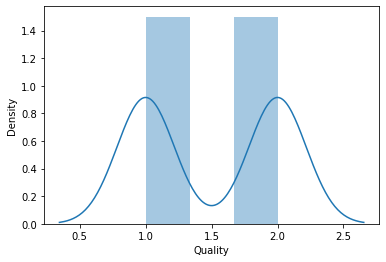

In [123]:
#Final plot
sns.distplot(Syn_df['Quality'],kde=True)

##### Conclusion

- When we have imbalanced datasets, intead of dropping values to balance it. we can create a synthetic data

- SMOTE is one of such over sampling technique

- It uses KNN algoritham to create synthetic data points between minority class

# `PART-3`

### `3.1. Data:`

Import, clean and pre-process the data

In [124]:
#Given dataset shape, Size
Part3_Given_df = pd.read_csv("Part3 - vehicle.csv")
Part3_Given_df.size, Part3_Given_df.shape

(16074, (846, 19))

- 19 dimentions of data we have in original data

In [125]:
#Backup
Part3_df = Part3_Given_df.copy()
#Verify
Part3_Given_df.shape, Part3_df.shape

((846, 19), (846, 19))

In [126]:
#Sample data 
Part3_df.sample(5).T

,179,286,722,788,402
compactness,89,83,94,115,101
circularity,44.0,41.0,45.0,52.0,52.0
distance_circularity,70.0,70.0,85.0,100.0,105.0
radius_ratio,137.0,155.0,163.0,203.0,162.0
pr.axis_aspect_ratio,58.0,65.0,68.0,62.0,53.0
max.length_aspect_ratio,6,7,10,10,10
scatter_ratio,136.0,144.0,157.0,217.0,212.0
elongatedness,49.0,46.0,44.0,31.0,31.0
pr.axis_rectangularity,18.0,19.0,20.0,24.0,24.0
max.length_rectangularity,146,141,156,165,163


- All numeric except class variable
- Class seems to be the type of vehicle

In [127]:
#Info
Part3_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

- Except the class variable, we have all numeric attributes
- We see there is difference between no.of non-null rows for few columns
- Class is only catogorical & lets encode it too.

In [128]:
#Encoding the class
le = LabelEncoder() 
Part3_df['class'] = le.fit_transform(Part3_df['class'])

Part3_df['class'].value_counts()

1    429
0    218
2    199
Name: class, dtype: int64

In [129]:
#Looking for null values
Part3_df.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [130]:
#Imputing Null values
imputer = SimpleImputer(strategy='median')
imputer.fit(Part3_df)

SimpleImputer(strategy='median')

###### Lets inspect median values of Imputer before we start imputing

In [131]:
#Imputer median values
imputer.statistics_

array([ 93. ,  44. ,  80. , 167. ,  61. ,   8. , 157. ,  43. ,  20. ,
       146. , 179. , 363.5, 173.5,  71.5,   6. ,  11. , 188. , 197. ,
         1. ])

In [132]:
#Dataset median values
Part3_df.median().values

array([ 93. ,  44. ,  80. , 167. ,  61. ,   8. , 157. ,  43. ,  20. ,
       146. , 179. , 363.5, 173.5,  71.5,   6. ,  11. , 188. , 197. ,
         1. ])

- We have same median values in dataset & imputer statistics, so lets replace it.

In [133]:
#Since Imputer returns ndarray type, so lets store it in temp first
temp = imputer.transform(Part3_df)
#Storing the transofrmed array into Dataframe
Part3_df = pd.DataFrame(temp,columns=Part3_df.columns, index=Part3_df.index)

In [134]:
#Rechecking for null values 
Part3_df.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

- No null values present in data

In [135]:
#Checking if any duplicated rows present
Part3_df.duplicated().sum()

0

### `3.2. EDA and visualisation:`

- Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.


**For example:** Use your best analytical approach to build this report. Even you can mix match columns to create new columns which can be used for better analysis. Create your own features if required. Be highly experimental and analytical here to find hidden patterns.

In [136]:
#Describe
Part3_df.iloc[:,:-1].describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.874704,33.401356,104.0,141.00,167.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.677305,7.882188,47.0,57.00,61.0,65.00,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.00,55.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


- Radius_ration, Max_length_aspect_ratio,Scaled_varience,1 - have their max values way from median, so outliers might be present
- Compactness, Circularity seems to have normally distributed
- Skeness_about, Skewness_about1 only have min value as 0
- Skewness_about1 has min 0 & max 41,seems to be right skewed

In [137]:
#Distribution of continues data
Part3_df.iloc[:,:-1].skew()

compactness                    0.381271
circularity                    0.264928
distance_circularity           0.108718
radius_ratio                   0.397572
pr.axis_aspect_ratio           3.835392
max.length_aspect_ratio        6.778394
scatter_ratio                  0.608710
elongatedness                  0.046951
pr.axis_rectangularity         0.774406
max.length_rectangularity      0.256359
scaled_variance                0.655598
scaled_variance.1              0.845345
scaled_radius_of_gyration      0.279910
scaled_radius_of_gyration.1    2.089979
skewness_about                 0.780813
skewness_about.1               0.689014
skewness_about.2               0.249985
hollows_ratio                 -0.226341
dtype: float64

- Most of them are lear to zero, which is normally distribted
- max.length_aspect_ratio is highly postive skewed(right)
- pr.axis_aspect_ratio & scaled_radius_of_gyration.1 are other too highly postive skewed
- hollows_ration is the only one negatively skewed
- elongatedness is very nearly normal distributed

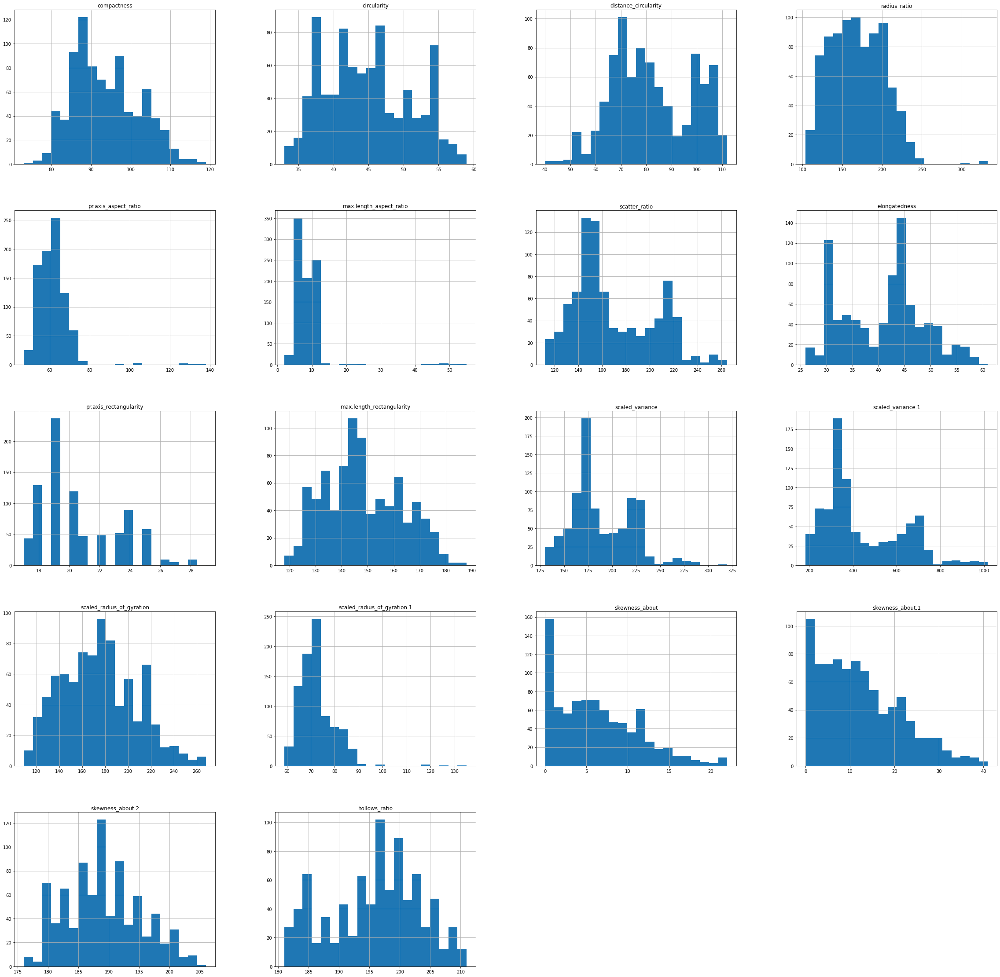

In [138]:
#Visualize the distribution with Histograms
Part3_df.iloc[:,:-1].hist(bins=20, figsize=(40,40))
plt.show()

- we have different distributions of data present

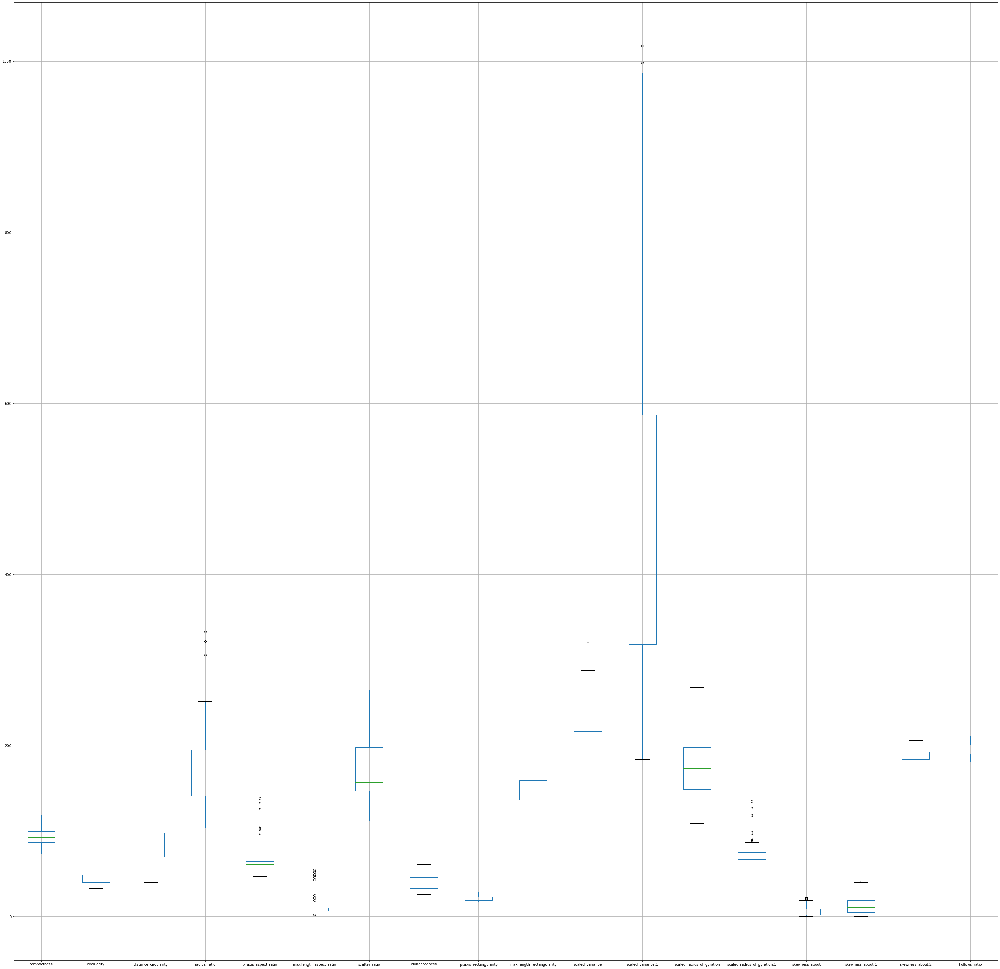

In [139]:
#Boxplot
plt.figure(figsize=(50,50))
Part3_df.iloc[:,:-1].boxplot()
plt.show()

- Outliers are present in almost 8 attributes
- Max.length_aspect_ration & scaled_radius_of_gyration1  both these have more outliers

#### Eliminating the outliers & replacing with Median values

In [140]:
#import math
#Get the lower fence from the box plot.
cols = Part3_df[Part3_df.columns.difference(['class'])].columns
for c in cols :
    Q1 = Part3_df[c].quantile(0.25)
    Q2 = Part3_df[c].quantile(0.50)
    Q3 = Part3_df[c].quantile(0.75)
    medc = Part3_df[c].median()
    
    IQR = Q3-Q1
    Lower_Fence = (Q1 - (1.5 * IQR)).round(decimals=4)
    lrow_nos = np.where(Part3_df[c] < Lower_Fence)
    Part3_df.loc[(Part3_df[c] < Lower_Fence),c] = medc
    
    #Check number of outliers greater than upper fence.
    Upper_Fence = (Q3 + (1.5 * IQR)).round(decimals=4)
    urow_nos = np.where(Part3_df[c] > Upper_Fence)
    Part3_df.loc[(Part3_df[c] > Upper_Fence),c] = medc

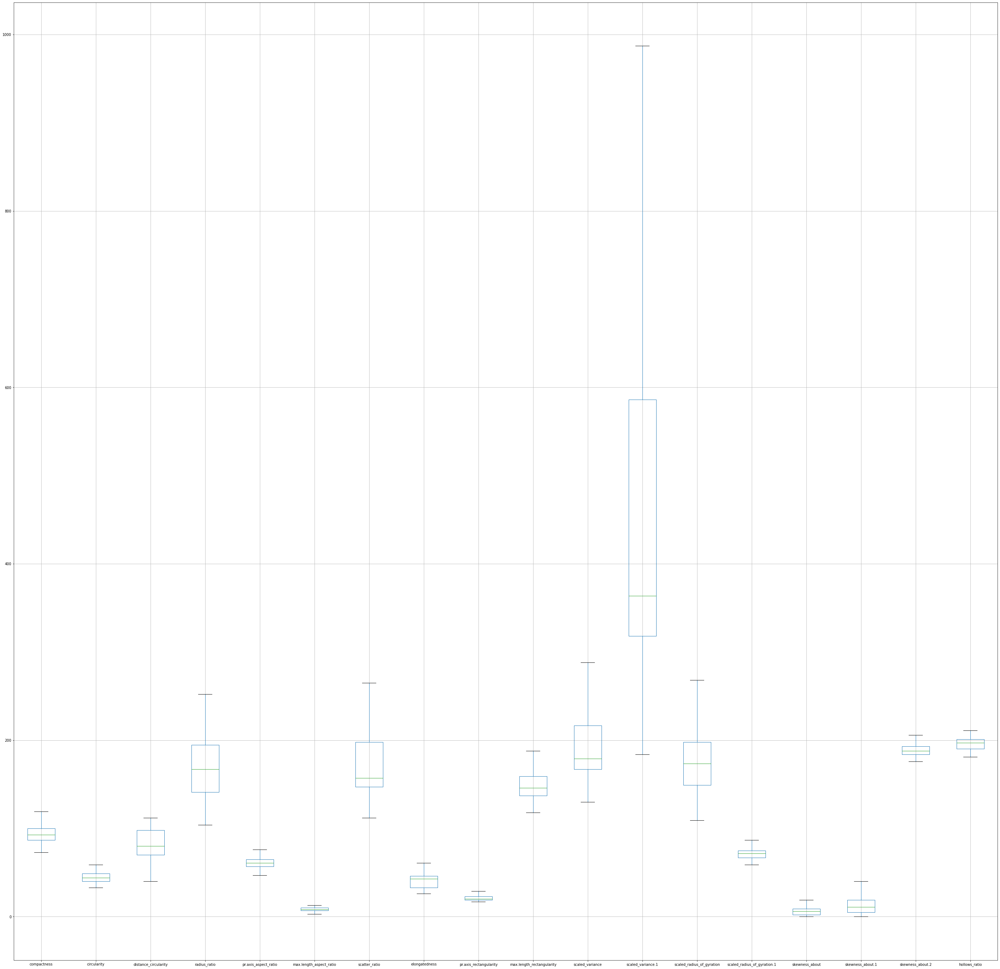

In [141]:
#Boxplot now again
plt.figure(figsize=(50,50))
Part3_df.iloc[:,:-1].boxplot()
plt.show()

- Since the dataset is small, we can't afford to lose any info by just dropping the outliers
- Now we have dataset without outliers

1    429
0    218
2    199
Name: class, dtype: int64


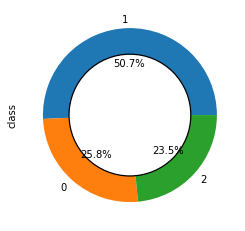

In [142]:
#Frequency distributions of the CLASS
Part3_df['class']=Part3_df['class'].astype('int')
print(Part3_df['class'].value_counts())
fig, ax = plt.subplots()
fig = plt.gcf()
centre_circle = plt.Circle((0,0),0.7,color='black', fc='white',linewidth=1.25)
fig.gca().add_artist(centre_circle)
Part3_df['class'].value_counts().plot(ax=ax, kind='pie',autopct='%1.1f%%')
plt.show()

 Class 1 : is 50%
 Class 0: 25%, Class 1: 23%

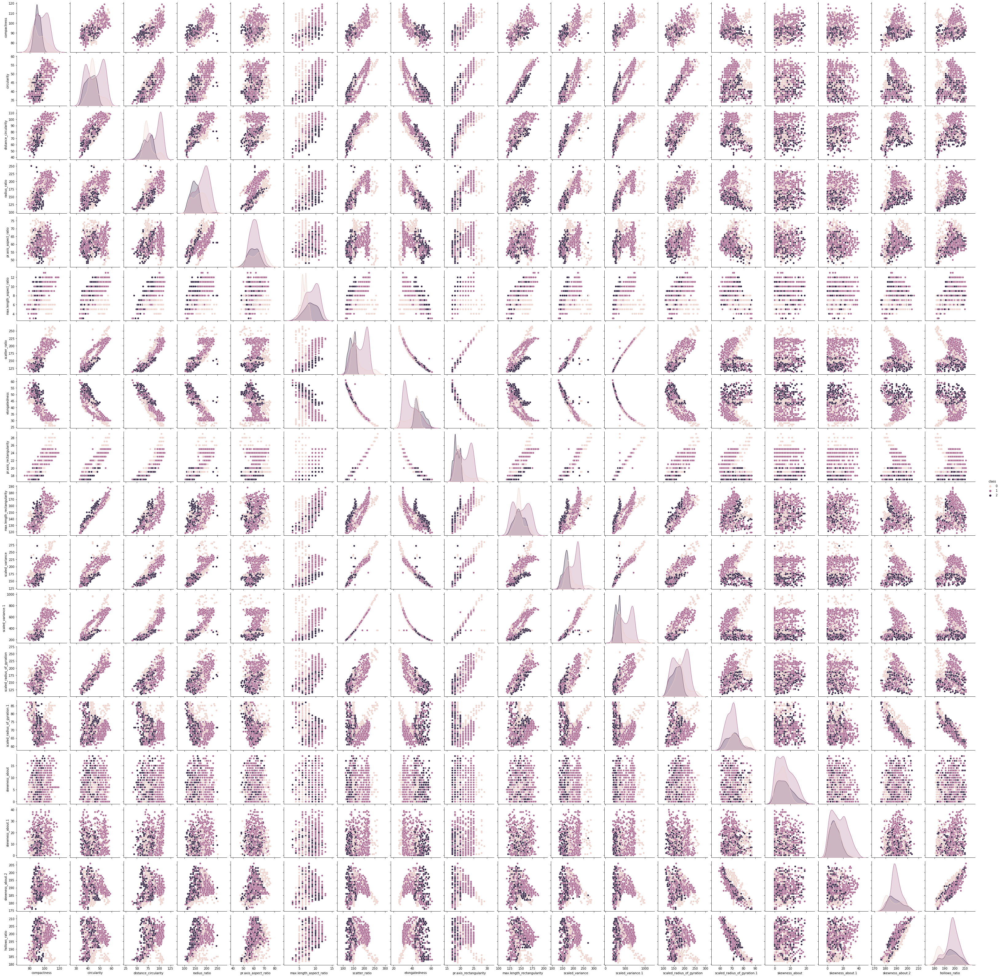

In [144]:
#The pairwise relationships in the dataset.
# also, we add hue to see these distrbutions with the class col

sns.pairplot(Part3_df, hue="class")

We have few rows but too many columns here.

Its difficult to visualize the dataset with more attributes. But lets have a top-angle observations

- First 13 atrributes have almost linear (+ve or -ve) relationship with each other
- Last 5 attributes seems to have no proper relationship

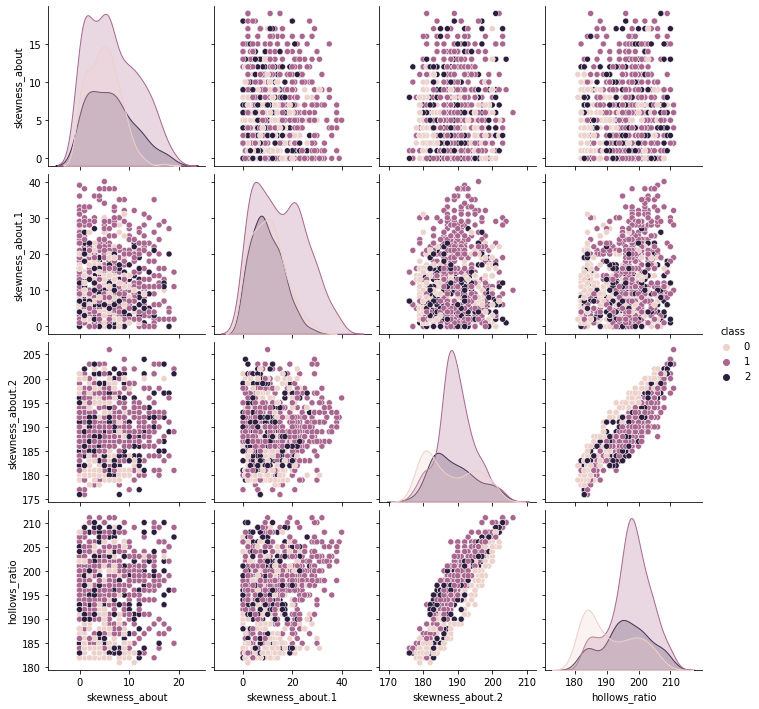

In [145]:
#Last 5 attributes
sns.pairplot(Part3_df.iloc[:,-5:], hue="class")

<AxesSubplot:>

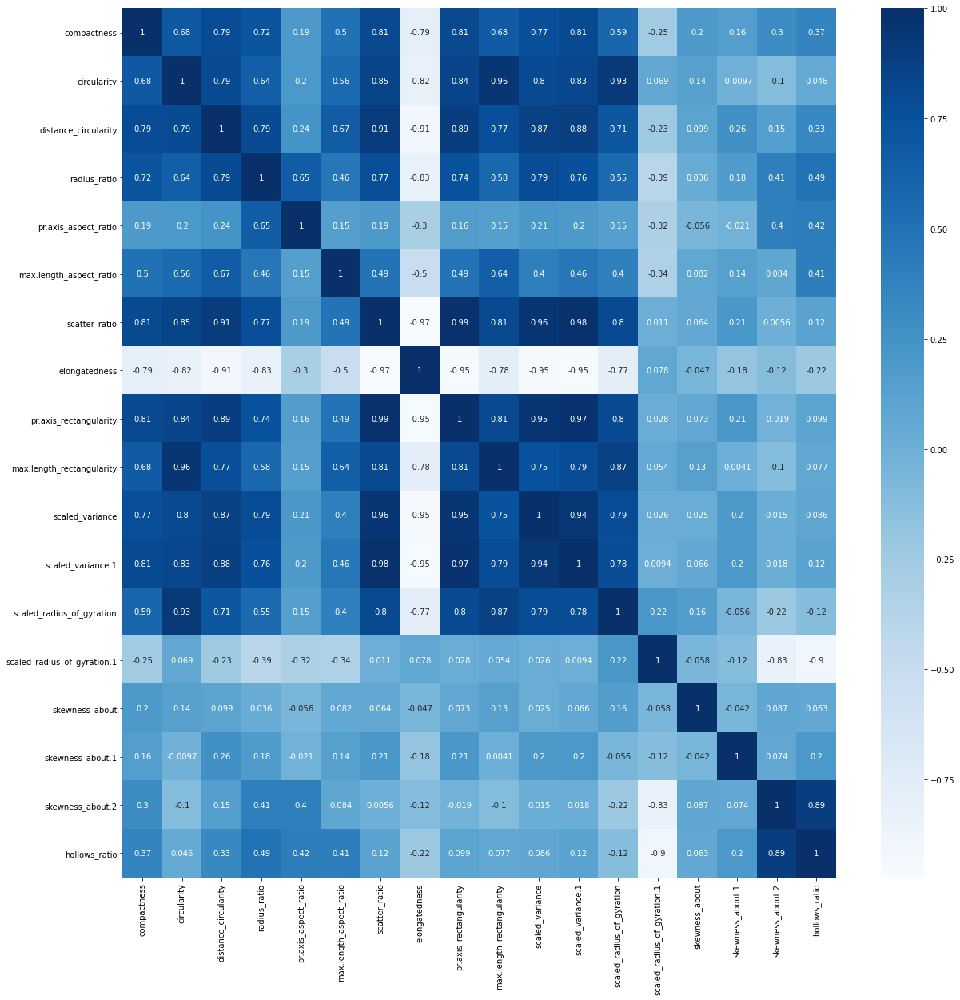

In [146]:
#plotting the correlation 
fig,ax=plt.subplots(figsize=(20,20))
sns.heatmap(Part3_df.iloc[:,:-1].corr(),ax=ax,annot=True,cmap='Blues')


- elongatedness seems to have strong negative correlation with most of attributes
- Scaled Variance & Scaled Variance.1 seems to be strongly correlated
- skewness_about_2 and hollow_ratio seems to be strongly correlated
- ditance_circularity and radius_ratio seems to have high positive correlation
- scatter_ratio and elongatedness seems to be have strong negative correlation
- elongatedness and pr.axis_rectangularity seems to have strong negative correlation
- pr.axis_aspect_ratio & max_length_aspect_ratio seems to have very little correlation
- scaled_radius_gyration & scaled_radisu_gyration.1 seems to be very little correlate
- scaled_radius_gyration.1 & skewness_about seems to be very little correlated
- skewness_about & skewness_about.1 not be correlated
- skewness_about.1 and skewness_about.2 are not correlated.

### `3.3. Classifier: `

Design and train a best fit SVM classier using all the data attributes.

In [147]:
# independant variables
X = Part3_df.drop(['class'], axis=1)
# the dependent variable
y = Part3_df[['class']]

In [148]:
#spliting 70% train, 30% test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [149]:
#SVC model before we do dimensionality reduction
svc = SVC()
svc.fit(X_train, y_train)

print("Accuracy on training set: {:.2f}".format(svc.score(X_train, y_train)))
print("Accuracy on test set: {:.2f}".format(svc.score(X_test, y_test)))

Accuracy on training set: 0.68
Accuracy on test set: 0.65


### `Scaling`

In [150]:
#Z score
XScaled=X.apply(zscore)
XScaled.head(2)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.16058,0.518073,0.057177,0.300945,1.933135,0.912212,-0.207598,0.136262,-0.224342,0.758332,-0.400771,-0.337407,0.285705,-0.315806,-0.03233,0.387162,-0.312012,0.183957
1,-0.32547,-0.623732,0.120741,-0.850666,-0.740596,0.427456,-0.599423,0.520519,-0.610886,-0.344578,-0.594220,-0.618623,-0.513630,0.009122,0.62409,0.161740,0.013265,0.452977


In [151]:
#spliting 70% train, 30% test
X_train, X_test, y_train, y_test = train_test_split(XScaled, y, test_size=0.3, random_state=1)
svc = SVC()
svc.fit(X_train, y_train)

print("Accuracy on training set: {:.2f}".format(svc.score(X_train, y_train)))
print("Accuracy on test set: {:.2f}".format(svc.score(X_test, y_test)))

Accuracy on training set: 0.97
Accuracy on test set: 0.96


- Original dataset with Scaling, did very well on SVM model
- Lets reduce few dimentions & see how the performance would be.

### `3.4. Dimensional reduction: `

perform dimensional reduction on the data.

In [152]:
#Using all components for now to calculate the explained varance%
pca = PCA(n_components = 18)
X5D = pca.fit(XScaled)
pca.explained_variance_ratio_

array([5.40993254e-01, 1.85931025e-01, 6.61651173e-02, 6.29154973e-02,
       4.90529110e-02, 3.69710110e-02, 1.76541580e-02, 1.26616348e-02,
       7.27020705e-03, 4.43152841e-03, 4.07284383e-03, 3.58554935e-03,
       2.22763400e-03, 1.79098315e-03, 1.63104981e-03, 1.25964961e-03,
       1.09945865e-03, 2.86487251e-04])

 - As we see 54% variance is explained by PCA1 & 18% from PCA2..etc
 - We need to find a optimal number for d in order to preserve the maximum variance in the data
 - Lets visualize this using bar chart

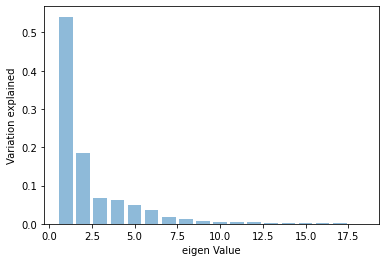

In [153]:
plt.bar(list(range(1,19)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

**More than half attributes seems to be trivial**

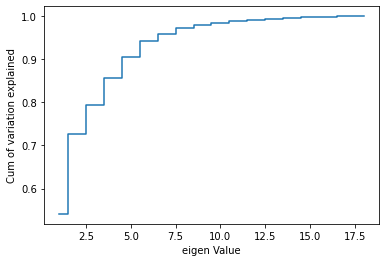

In [154]:
plt.step(list(range(1,19)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

- Based on elbow method, we can the max variation is explained aroud 7 & from there on the %variance of remaning PCAs is negligible.




- We can also choose this value programatically & by keeping the required % variance like below.

In [155]:
#Choosing d by passing the %variance
cumsum = np.cumsum(pca.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.95) + 1
print(d)

7


**We can either pass the no.of dimension value or give the max value for % of variance that needs to be preserved as shown below**

In [156]:
pca7 = PCA(n_components = d) #Method1
pca95 = PCA(n_components = 0.95) #Method2 #95% variance as our target
pca7.fit(XScaled)
pca95.fit(XScaled)

X_reduced95 = pca95.fit_transform(XScaled)
X_reduced7 = pca7.fit_transform(XScaled)

In [157]:
print(pca7.components_)

[[ 0.27250289  0.28725469  0.30242111  0.26971354  0.09786073  0.19520014
   0.31052393 -0.3090069   0.307287    0.27815416  0.29976509  0.30553237
   0.26323762 -0.04193594  0.03608321  0.05872048  0.03801314  0.08474   ]
 [-0.08704358  0.13162176 -0.04614301 -0.19793126 -0.25783995 -0.10804563
   0.07528535 -0.01322994  0.0875602   0.12215424  0.07726575  0.07150302
   0.21058205  0.50362158 -0.01576632 -0.09274624 -0.50162122 -0.50761211]
 [-0.03818521 -0.20114691  0.06346211  0.05628517 -0.06199275 -0.14895782
   0.10904283 -0.09085269  0.1060705  -0.21368469  0.1445998   0.11034374
  -0.20287019  0.07386402 -0.55917399  0.6706805  -0.06224071 -0.04170535]
 [ 0.13867501 -0.03805548  0.10895429 -0.25435509 -0.61276572  0.27867816
   0.00539295  0.06521486  0.03089915  0.04146747 -0.06400509 -0.00219687
  -0.08553965 -0.11539962  0.47370331  0.42842603 -0.0274096   0.09603749]
 [ 0.13710147 -0.13899555 -0.08001743  0.13374437  0.12360146 -0.63489336
   0.08555745 -0.07907344  0.08164

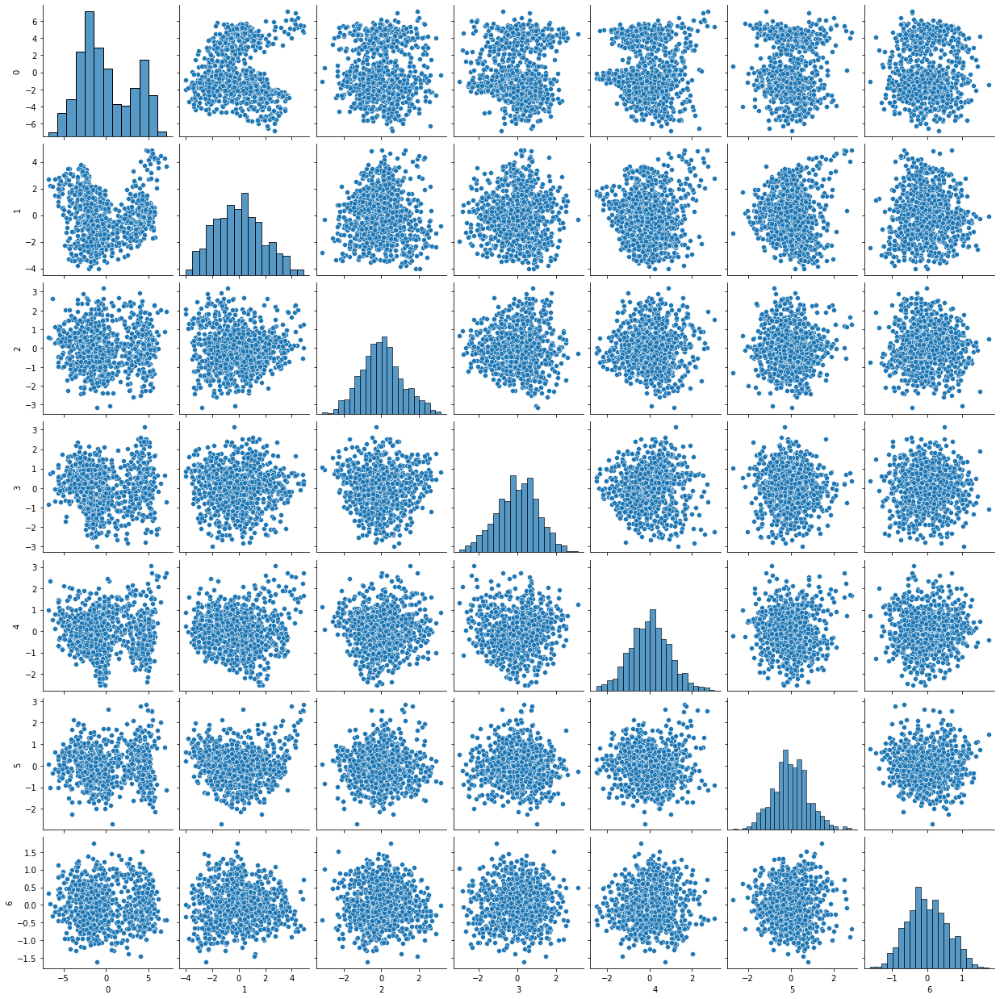

In [158]:
sns.pairplot(pd.DataFrame(X_reduced7))

- So we have now 7 attributes
- We reduced from 19 to 7
- Lets pass this dataset to SVC model & see how well it performs.

### `3.5. Classifier:`

Design and train a best fit SVM classier using dimensionally reduced attributes.

In [159]:
#spliting 70% train, 30% test
X_train, X_test, y_train, y_test = train_test_split(X_reduced7, y, test_size=0.3, random_state=1)

In [162]:
XScaled.shape

(846, 18)

- Original is 18 attributes

In [163]:
X_reduced7.shape, X_reduced95.shape

((846, 7), (846, 7))

- **Case 1:** We selected d value manually by elbow method
- **Case 2:** We set our target varaince as 95%, d value is decided by the model itself

In [164]:
#spliting 70% train, 30% test
X_train, X_test, y_train, y_test = train_test_split(X_reduced7, y, test_size=0.3, random_state=1)
svc = SVC()
svc.fit(X_train, y_train)

print("Accuracy on training set: {:.2f}".format(svc.score(X_train, y_train)))
print("Accuracy on test set: {:.2f}".format(svc.score(X_test, y_test)))

Accuracy on training set: 0.94
Accuracy on test set: 0.93


**We have reduced from 18 to 7 attributes by losing just 3% score from original SVC model**
isn't it beautiful?

In [165]:
#spliting 70% train, 30% test
X_train, X_test, y_train, y_test = train_test_split(X_reduced95, y, test_size=0.3, random_state=1)
svc = SVC()
svc.fit(X_train, y_train)

print("Accuracy on training set: {:.2f}".format(svc.score(X_train, y_train)))
print("Accuracy on test set: {:.2f}".format(svc.score(X_test, y_test)))

Accuracy on training set: 0.94
Accuracy on test set: 0.93


**We have reduced by setting target as 95% variance by just losing 3% score from original dataset**

### `3.6. Conclusion: `

Showcase key pointer on how dimensional reduction helped in this case.

- We have reduced the dimensonality from 18 to 7
- Original dataset SVM model score is 97% (Train), 96% (Test)
- Reduced dimensions dataset has SVM score 94%(Train), 93%(Test)

Uses:

- It sppeds up the model as dimensions are few compared to original
- It takes less processing time while building ML models
- It takes less size in memory
- We can get rid of un-necessary (non-representative data)
- It drops the noise in data

# `PART-4`

### `4.1. EDA and visualisation:`

 Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden
patterns by using all possible methods.

In [167]:
#Given dataset
Part4_Given = pd.read_csv("Part4 - batting_bowling_ipl_bat.csv")
Part4_Given.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN


- Dataset seems to have many null rows

In [168]:
print('Given DataSet Shape ::',Part4_Given.shape)
print('Given DataSet Size ::',Part4_Given.size)

Given DataSet Shape :: (180, 7)
Given DataSet Size :: 1260


In [169]:
#Lets copy the main df before we start making any changes
Part4_df = Part4_Given.copy()
#Verify the both df
Part4_df.shape, Part4_Given.shape

((180, 7), (180, 7))

In [170]:
#Null values
Part4_df.isnull().sum()

Name     90
Runs     90
Ave      90
SR       90
Fours    90
Sixes    90
HF       90
dtype: int64

- Each columns has equal no.of null rows i.e we have null values for each columns in those rows
- Lets verify that

In [171]:
#Duplicate rows
Part4_df.duplicated().sum()

89

In [172]:
#Sum of rows which has all NaN values
Part4_df.isnull().all(1).sum()

90

In [173]:
#No.of rows are reduced half after dropping null values(rows)
Part4_df = Part4_df.dropna()
Part4_df.shape

(90, 7)

In [174]:
Part4_df.isnull().sum()

Name     0
Runs     0
Ave      0
SR       0
Fours    0
Sixes    0
HF       0
dtype: int64

- No null values columns wise

In [175]:
#Data Types
Part4_df.dtypes

Name      object
Runs     float64
Ave      float64
SR       float64
Fours    float64
Sixes    float64
HF       float64
dtype: object

- Except name, we have all numerical columns

In [176]:
#Statastical analysis
Part4_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Runs,90.0,219.933333,156.253669,2.00,98.000,196.500,330.7500,733.00
Ave,90.0,24.729889,13.619215,0.50,14.665,24.440,32.1950,81.33
SR,90.0,119.164111,23.656547,18.18,108.745,120.135,131.9975,164.10
Fours,90.0,19.788889,16.399845,0.00,6.250,16.000,28.0000,73.00
Sixes,90.0,7.577778,8.001373,0.00,3.000,6.000,10.0000,59.00
HF,90.0,1.188889,1.688656,0.00,0.000,0.500,2.0000,9.00


- Runs median is way far from Max value, so the distribution is skewed
- Ave min is way less than Max value
- SR seems to have slight normal distibution
- Fours & Sixes & HF min value is 0
- SR ranges from low 18 & high 164

In [177]:
#Skewness
Part4_df.skew()

Runs     0.754618
Ave      1.038076
SR      -1.166175
Fours    1.107192
Sixes    3.226595
HF       2.001199
dtype: float64

- SR is only one with negative skewness(left)
- Rest of them all positive skewness
- Sixes is highly positive skewed
- Except Runs, none them are near 0 (normal distribution)

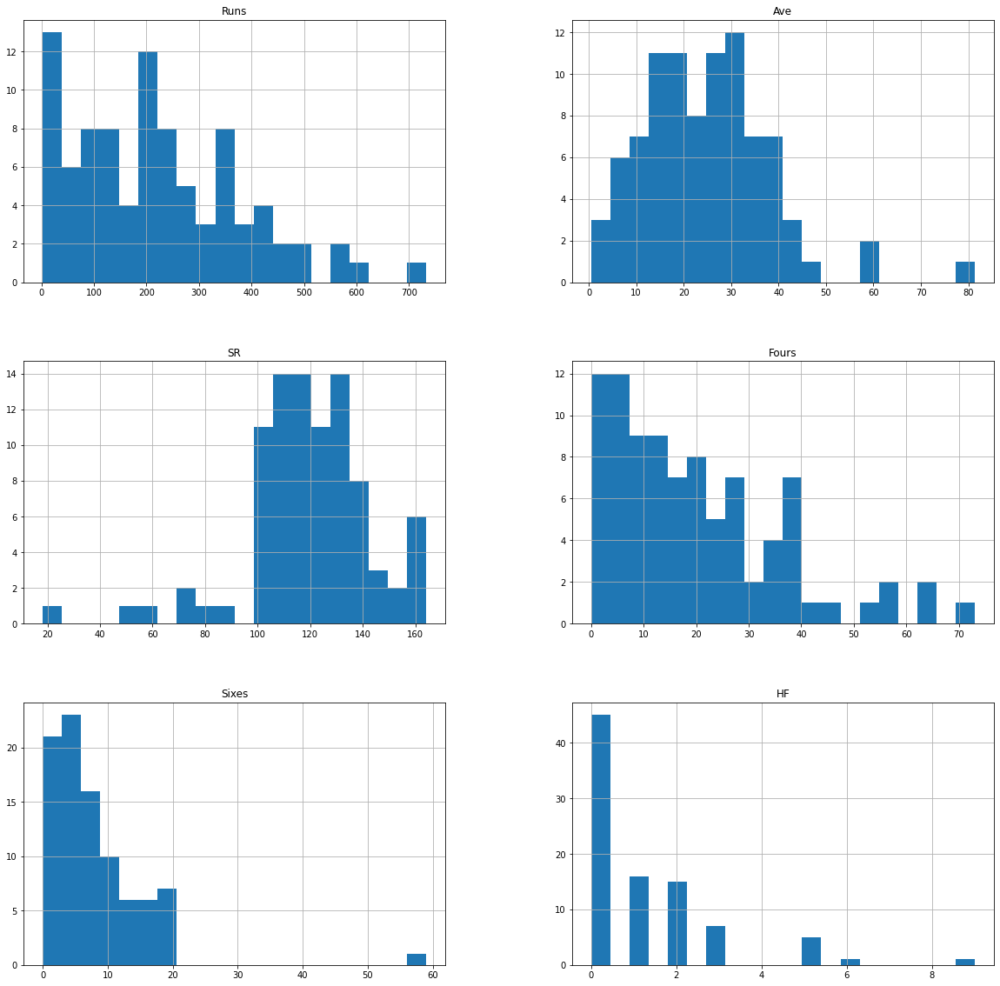

In [178]:
#Visualize the distribution with Histograms
Part4_df.hist(bins=20, figsize=(20,20))
plt.show()

- Runs & Ave & 4s & 6s & HF go higher, no.of players are less
- Very few players with low SR
- Unline other features, SR is left skewed

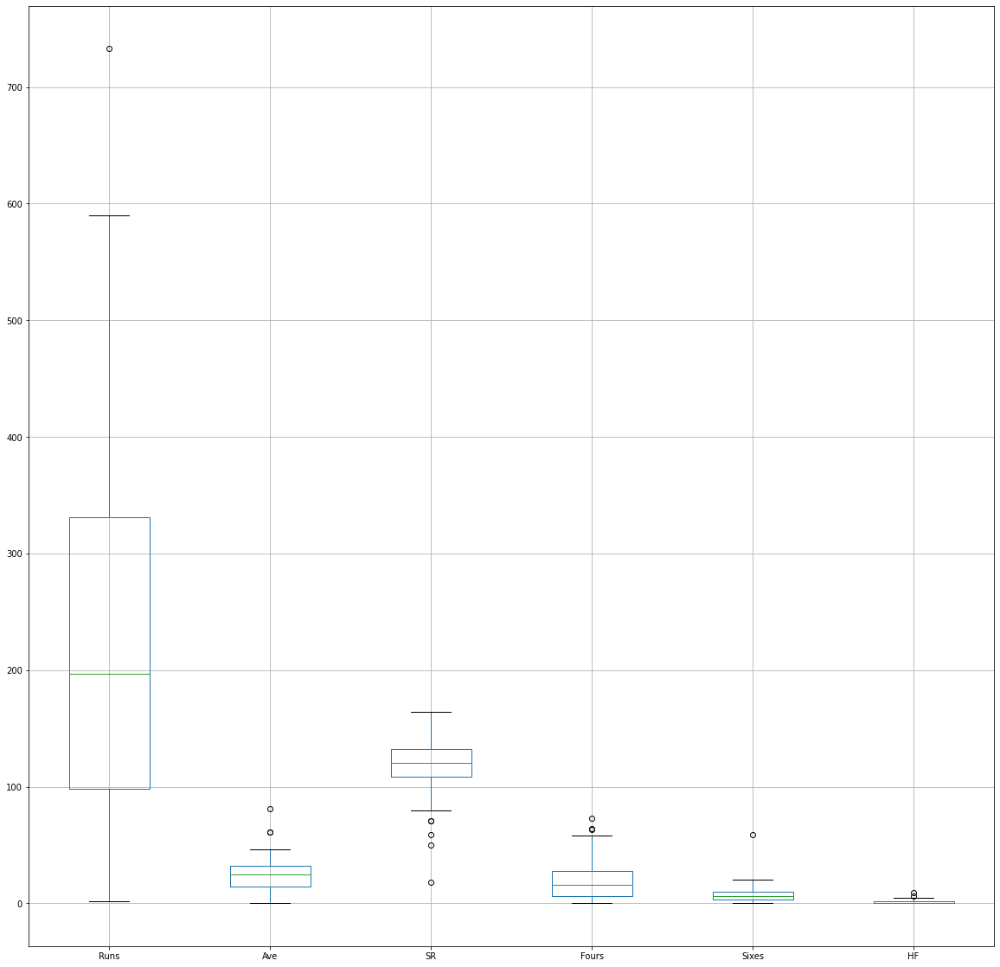

In [179]:
plt.figure(figsize=(20,20))
Part4_df.boxplot()
plt.show()

- All has outliers
- Since this is Ranking model, we would consider outlier values too 

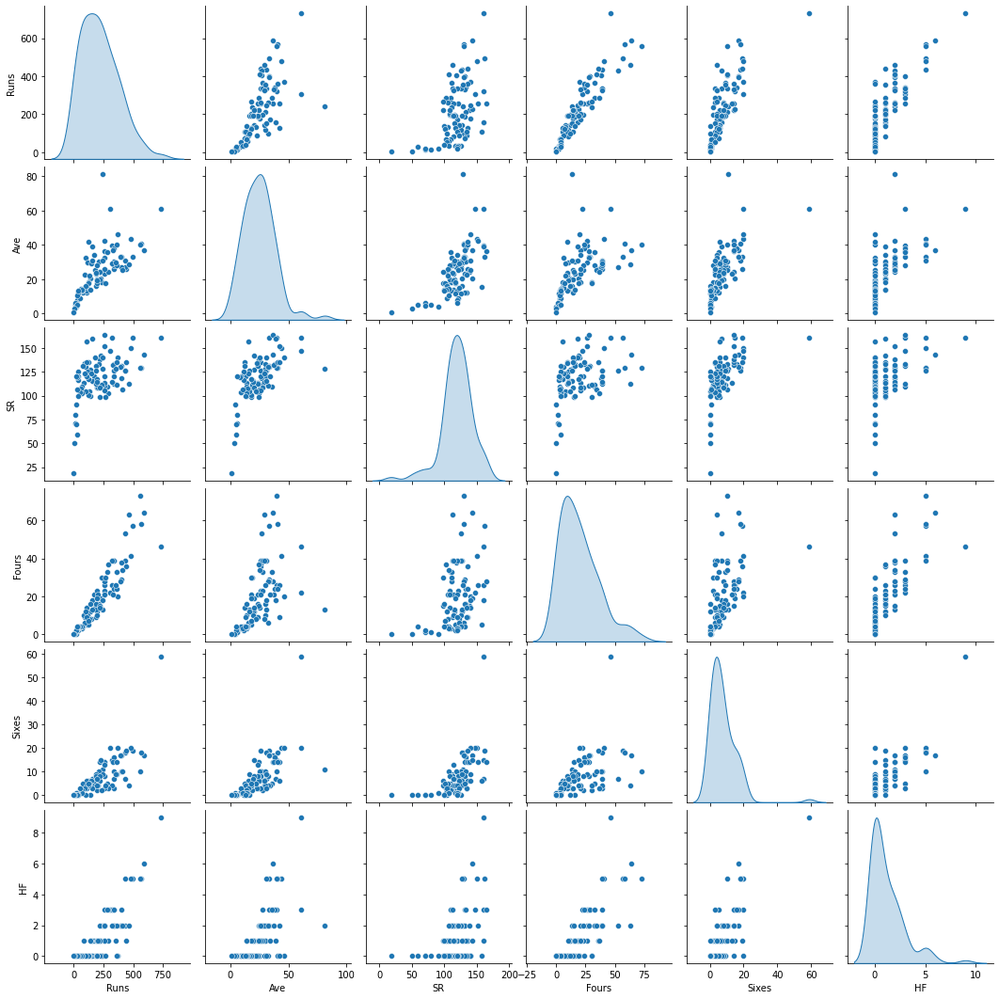

In [180]:
#Pairplot
sns.pairplot(Part4_df,  diag_kind='kde')

- From the daig graphs, there seems to be 2 clusters present or 3 (HF,Ave grpahs)

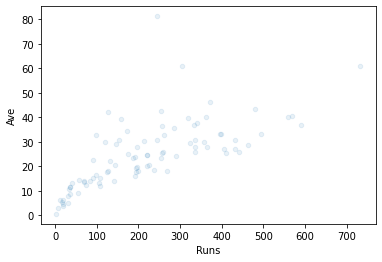

In [181]:
Part4_df.iloc[:,1:].plot(x='Runs',y='Ave',kind='scatter',alpha=0.1)
plt.show()

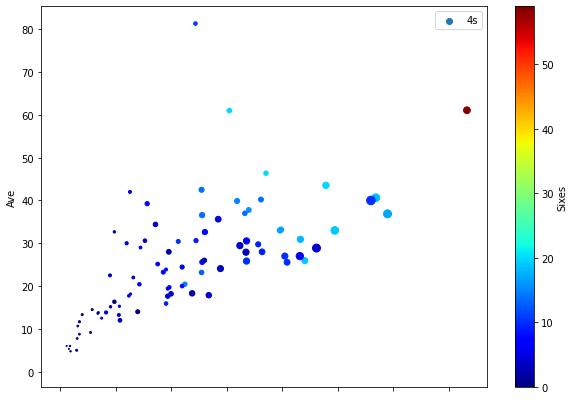

In [183]:
Part4_df.iloc[:,1:].plot(x='Runs',y='Ave',kind='scatter',
                       s=Part4_df['Fours'],label='4s', figsize=(10,7),
                       c='Sixes', cmap=plt.get_cmap('jet'),colorbar=True)
plt.legend()

- Few ppl with highest Sixes
- Blue indicates with few sixes
- Smaller circles indicates more fours
- one player seems to have better Ave, highest runs, more 6s, 4's
- One player with highest Ave seems to have less 4's & 6's


<AxesSubplot:>

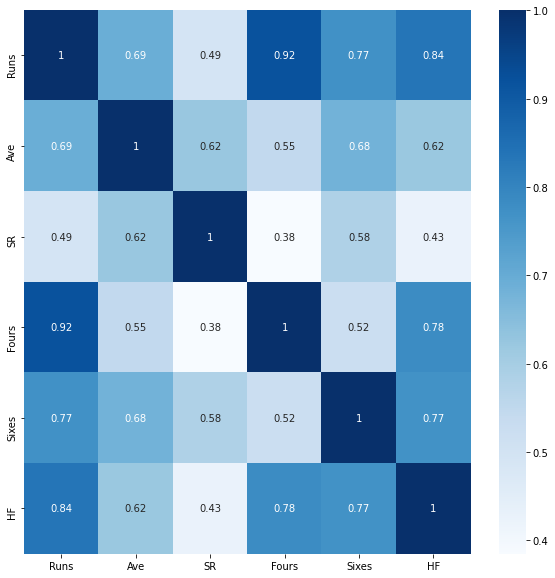

In [184]:
#plotting the correlation 
fig,ax=plt.subplots(figsize=(10,10))
sns.heatmap(Part4_df.corr(),ax=ax,annot=True,cmap='Blues')

- All attributes have strong postive correlationship with each other
- No negative correlation in the data

### `4.2. Build a data driven model:`

To rank all the players in the dataset using all or the most important performance features

In [185]:
#Finding optimal no. of clusters
Part4_df.drop('Name',axis=1,inplace=True)

In [186]:
##Scale the data
from scipy.stats import zscore
Part4_df_Z = Part4_df.apply(zscore)

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

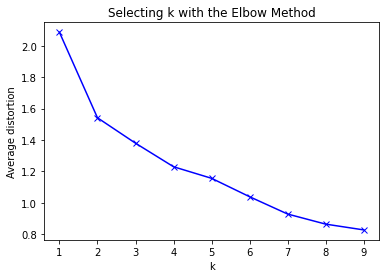

In [187]:
clusters = range(1,10)
meanDistortions = []

for k in clusters:
    model = KMeans(n_clusters=k)
    model.fit(Part4_df_Z)
    prediction = model.predict(Part4_df_Z)
    meanDistortions.append(sum(np.min(cdist(Part4_df_Z, model.cluster_centers_, 'euclidean'), axis=1)) / Part4_df_Z.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')

- K = 2 seems to be the optimal here

Lets verify the silhoutte score for both **K=2 & K=3**

In [188]:
model2 = KMeans(n_clusters=2)
model2.fit(Part4_df_Z)
print(silhouette_score(Part4_df_Z,model2.labels_))

model3 = KMeans(n_clusters=3)
model3.fit(Part4_df_Z)
print(silhouette_score(Part4_df_Z,model3.labels_))

0.41111085574076756
0.3749672949562151


- Silhouette score is better when k=2, so lets keep that as final value

In [189]:
Part4_df["Rank"] = model2.labels_

In [190]:
clust_profile = Part4_df
clust_profile = clust_profile.groupby('Rank').mean()
clust_profile['freq'] = Part4_df.Rank.value_counts().sort_index()

clust_profile

,Runs,Ave,SR,Fours,Sixes,HF,freq
Rank,,,,,,,
0,122.745455,17.582000,110.481455,10.309091,3.636364,0.218182,55
1,372.657143,35.962286,132.808286,34.685714,13.771429,2.714286,35


 Simple Rankings here, Say Rank 0 & Rank 1 exists in our dataset.
 
 **Rank 0:** Players with higher scores (Runs, Ave, SR, Fours, Sixes, HF) & we have 35 out of 90.
 
 **Rank 1:** Players with low scores (Runs, Ave, SR, Fours, Sixes, HF) & we have 55 out of 90.
 
 
 **Players in both clusters have almost near SR mean.**
 
 
 
 SR seems to be not much impactful here.

# `PART-5`

### `5.1. List down all possible dimensionality reduction techniques that can be implemented using python.`

#### Most popular methods:

- **Prinicipal Component Analysis(PCA):**
    * Most used method
    * It identifies the hyperplane that lies closest to the data, and then it projects downs to d dimentions (d<n)
- **Incremental PCA:**
    * Allow us to split the dataset into mini batches and feed the algoritham one batch at a time
    * Useful in large datasets and for applying PCA online (i.e on the fly)
- **Kernal PCA:**
    * Just like SVM method, we use kernal trick to perform complex nonlinear projections
- **Locally Linear Embedding (LLE):**
    * Nonlinear & Manifold technique
    * Doesn't depend on projections

##### Other Scikit-Learn techniques

- **Randome Projections**

    Uses randome functions (sklearn.random_projection)
    
    
- **Multidimensional Scaling(MDS)**

    Reduces dimensionality while trying to preserves the distances between the instances
    
    
- **Isomap**

    Reduces dimensionality while trying to preserve the geodesic distances between the instances
    
    
- **t-Distributed Stochastic Neighbour Embedding (t-SNE)**

    Reduces dimensionality while trying to keep similar instances close & dissimilar instances apart
    
    
- **Linear Discriminant Analysis (LDA)**

    Uses disriminitive axes between the classes to define the hyperplane & best before apllying any classification method like SVM


### `5.2. So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python.`

Yes, we can use PCA on multimedia data as well.


- This will be used to compress the data & using **pca.inverse_transform** method to reconstruct from lower dimensions

- With just minimal resconstruction error, we can successfuly use PCA on images

- This technique saves the space to store images

- This technique helps the blurred/uncleared images to reconstruct well.

- This will be helpful for knowing crime scenes using like CCTV blurred footages

(535, 477, 3)


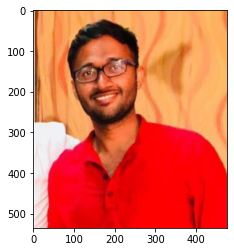

In [191]:
#Image from local machine
img = mplib.imread('test.jpg')
print(img.shape)
plt.imshow(img)

(535, 477)
1.0


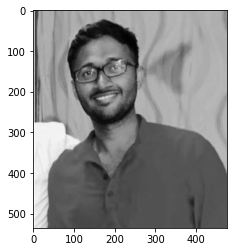

In [192]:
image_sum = img.sum(axis=2)
print(image_sum.shape)

image_bw = image_sum/image_sum.max()
print(image_bw.max())

plt.imshow(image_bw, cmap=plt.cm.gray)

Number of components explaining 95% variance: 11


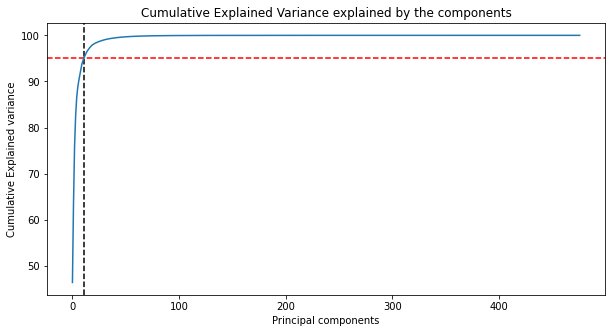

In [193]:
pca = PCA()
pca.fit(image_bw)

# Getting the cumulative variance
var_cumu = np.cumsum(pca.explained_variance_ratio_)*100

# How many PCs explain 95% of the variance?
k = np.argmax(var_cumu>95)
print("Number of components explaining 95% variance: "+ str(k))
#print("\n")

plt.figure(figsize=[10,5])
plt.title('Cumulative Explained Variance explained by the components')
plt.ylabel('Cumulative Explained variance')
plt.xlabel('Principal components')
plt.axvline(x=k, color="k", linestyle="--")
plt.axhline(y=95, color="r", linestyle="--")
ax = plt.plot(var_cumu)

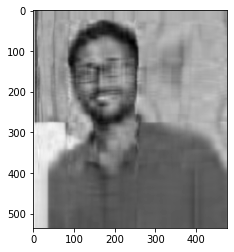

In [194]:
ipca = IncrementalPCA(n_components=k)
image_recon = ipca.inverse_transform(ipca.fit_transform(image_bw))

# Plotting the reconstructed image
#plt.figure(figsize=[12,8])
plt.imshow(image_recon,cmap = plt.cm.gray)

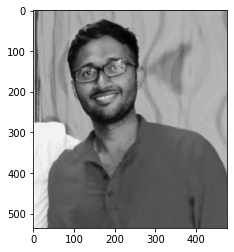

In [195]:
# Function to reconstruct and plot image for a given number of components

def plot_at_k(k):
    ipca = IncrementalPCA(n_components=k)
    image_recon = ipca.inverse_transform(ipca.fit_transform(image_bw))
    plt.imshow(image_recon,cmap = plt.cm.gray)
    

k = 150
#plt.figure(figsize=[12,8])
plot_at_k(100)

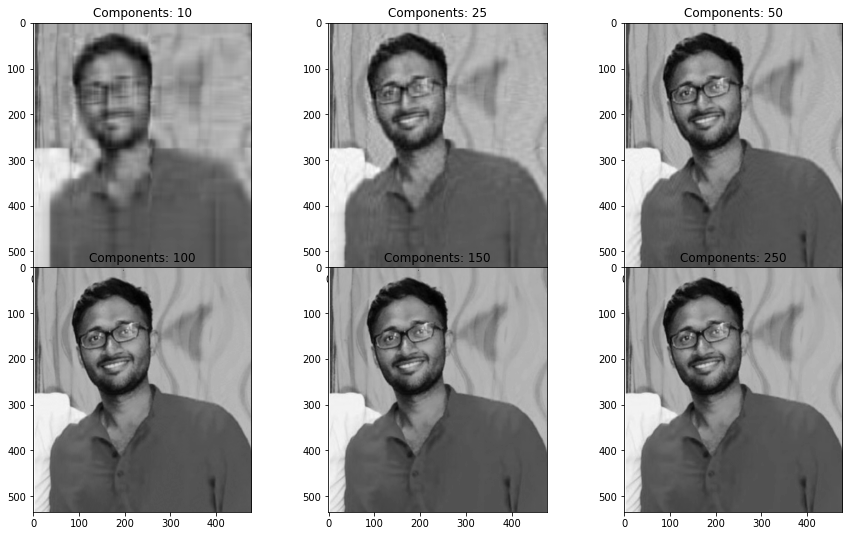

In [196]:
ks = [10, 25, 50, 100, 150, 250]

plt.figure(figsize=[15,9])

for i in range(6):
    plt.subplot(2,3,i+1)
    plot_at_k(ks[i])
    plt.title("Components: "+str(ks[i]))

plt.subplots_adjust(wspace=0.2, hspace=0.0)
plt.show()

- Image is good when k = 150
- We have k = 477 image & we reduced using PCA to 150 while maintaining the good image

In [198]:
#####****************************** THE  END ******************************#####